In [30]:
#Mendownload dataset
!gdown 1PwzKTSqLUEKMqTPnII6D3GkHHd1Xtfba

#Melakukan unzip file dataset
!unzip -q lung_image_sets.zip

#Menghapus file zip
!rm -rf lung_image_sets.zip

Downloading...
From (original): https://drive.google.com/uc?id=1PwzKTSqLUEKMqTPnII6D3GkHHd1Xtfba
From (redirected): https://drive.google.com/uc?id=1PwzKTSqLUEKMqTPnII6D3GkHHd1Xtfba&confirm=t&uuid=e5904ec7-6e0d-4c97-9a4c-8142f5996469
To: /workspace/TelU-TugasAkhir/lung_image_sets.zip
100%|████████████████████████████████████████| 929M/929M [00:43<00:00, 21.3MB/s]


In [34]:
import os
from sklearn.model_selection import train_test_split
import tensorflow as tf
import shutil   
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Input,Conv2D, MaxPooling2D, Flatten,BatchNormalization
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from scipy.stats import mode
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB1, EfficientNetB2, EfficientNetB3, EfficientNetB4, EfficientNetB5, EfficientNetB6, EfficientNetB7,MobileNetV2,DenseNet201
import time
import random

In [2]:
CWD = os.getcwd()
CWD

'/workspace/TelU-TugasAkhir'

In [19]:
base_dir = os.path.join(CWD, 'lung_image_sets')

def split_data_lung(base_dir, train_ratio=0.72, val_ratio=0.2, test_ratio=0.08):
    
    sets = ['lung_aca', 'lung_n', 'lung_scc']
    
    destination = './splitted_lung_2' 

    for set_name in sets:
        set_path = os.path.join(base_dir, set_name)
        images = os.listdir(set_path)

        # Split into train, val, and test
        train_images, temp_images = train_test_split(images, train_size=train_ratio, random_state=24)
        val_images, test_images = train_test_split(temp_images, test_size=test_ratio/(test_ratio + val_ratio),random_state=24)
        
        # Create directories if they don't exist
        for split in ['train', 'val', 'test']:
            split_dir = os.path.join(destination, split, set_name)
            os.makedirs(split_dir, exist_ok=True)
        
        # Move the images to their respective directories
        for image in train_images:
            shutil.copy(os.path.join(set_path, image), os.path.join(destination, 'train', set_name, image))
        
        for image in val_images:
            shutil.copy(os.path.join(set_path, image), os.path.join(destination, 'val', set_name, image))
        
        for image in test_images:
            shutil.copy(os.path.join(set_path, image), os.path.join(destination, 'test', set_name, image))
            
        print(f"Class '{set_name}' - Train: {len(train_images)}, Val: {len(val_images)}, Test: {len(test_images)}")
    print("Data splitted into train, validation, and test sets.")

In [20]:
split_data_lung(base_dir, train_ratio=0.7, val_ratio=0.15, test_ratio=0.15)

Class 'lung_aca' - Train: 3500, Val: 750, Test: 750
Class 'lung_n' - Train: 3500, Val: 750, Test: 750
Class 'lung_scc' - Train: 3500, Val: 750, Test: 750
Data splitted into train, validation, and test sets.


In [32]:
split_data(base_dir)

Data splitted into train, validation, and test sets.


In [3]:
def create_image_generators(train_dir, val_dir, test_dir, target_size=(224, 224), batch_size=32, preprocessing_func=None):
    # ImageDataGenerator without augmentation (for comparison)
    train_datagen_no_aug = ImageDataGenerator()

    # ImageDataGenerator with augmentation
    train_datagen_with_aug = ImageDataGenerator(
        rotation_range=20,
        # width_shift_range=0.2,
        # height_shift_range=0.2,
        shear_range=0.2,  # Shear angle in counter-clockwise direction in degrees
        zoom_range=0.2,   # Randomly zoom inside pictures
        horizontal_flip=True,
        vertical_flip=True,  # Flip the images vertically as well
        fill_mode='nearest',  # Strategy to fill newly created pixels
        brightness_range=[0.8, 1.2],  # Adjust brightness between 80% and 120%
    )
    
    # For validation and test sets, we do not apply augmentation
    val_test_datagen = ImageDataGenerator(
        preprocessing_function=preprocessing_func
    )
    
    # Flow images from directories
    train_generator_no_aug = train_datagen_no_aug.flow_from_directory(
        train_dir,
        target_size=target_size,
        batch_size=batch_size,
        shuffle=True,
        class_mode='categorical'
    )
    
    train_generator_with_aug = train_datagen_with_aug.flow_from_directory(
        train_dir,
        target_size=target_size,
        batch_size=batch_size,
        shuffle=True,
        class_mode='categorical'
    )
    
    val_generator = val_test_datagen.flow_from_directory(
        val_dir,
        target_size=target_size,
        batch_size=batch_size,
        shuffle=True,
        class_mode='categorical'
    )
    
    test_generator = val_test_datagen.flow_from_directory(
        test_dir,
        target_size=target_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )
    
    return train_generator_no_aug, train_generator_with_aug, val_generator, test_generator

In [24]:
# Pilih fungsi preprocessing yang sesuai dengan model
preprocess_input_func = efficientnet_preprocess

train_dir = os.path.join(CWD,'splitted/train')
val_dir = os.path.join(CWD,'splitted/val')
test_dir = os.path.join(CWD,'splitted/test')

train_lung_dir = os.path.join(CWD,'splitted_lung/train')
val_lung_dir = os.path.join(CWD,'splitted_lung/val')
test_lung_dir = os.path.join(CWD,'splitted_lung/test')

train_lung_2_dir = os.path.join(CWD,'splitted_lung_2/train')
val_lung_2_dir = os.path.join(CWD,'splitted_lung_2/val')
test_lung_2_dir = os.path.join(CWD,'splitted_lung_2/test')

In [5]:
def create_model(base_model_class, input_shape):
    base_model = base_model_class(input_shape=input_shape, include_top=False, weights='imagenet')
    base_model.trainable = True  

    total_layers = len(base_model.layers)
    for layer in base_model.layers[(int(0.5 * total_layers)):]:
        layer.trainable =  False

    inputs = Input(shape=input_shape)
    # Tidak perlu preprocessing lagi di sini
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.5)(x)

    outputs = Dense(5, activation='softmax')(x)

    model = Model(base_model.inputs, outputs)

    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model


In [6]:
def create_base_cnn(input_shape, num_classes=5):
    # Define the input
    inputs = Input(shape=input_shape)
    
    # First Convolutional Block
    x = Conv2D(32, (3, 3), activation='relu')(inputs)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    
    # Second Convolutional Block
    x = Conv2D(64, (3, 3), activation='relu')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Dropout(0.3)(x)  # Moderate dropout to prevent overfitting
    
    # Third Convolutional Block
    x = Conv2D(128, (3, 3), activation='relu')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Dropout(0.3)(x)  # Moderate dropout
    
    # Flatten and Fully Connected Layers
    x = Flatten()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.5)(x)
    
    # Output Layer
    outputs = Dense(num_classes, activation='softmax')(x)
    
    # Define the model
    model = Model(inputs=inputs, outputs=outputs)
    
    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

In [7]:
def create_callbacks(model_name, checkpoint_path, patience=3, reduce_lr_factor=0.5, reduce_lr_patience=2):
    if not os.path.exists(checkpoint_path):
        os.makedirs(checkpoint_path)

    saving_path = os.path.join(checkpoint_path, f'model_{model_name}.h5')

    # ModelCheckpoint to save the best model based on validation accuracy
    checkpoint = ModelCheckpoint(
        filepath=saving_path,  # Path to save the model
        monitor='val_accuracy',    # Monitor validation accuracy
        save_best_only=True,       # Save the model only when val_accuracy improves
        mode='max',                # Maximize validation accuracy
        verbose=1                  # Show messages when saving
    )
    
    # EarlyStopping to stop training when the model stops improving
    early_stopping = EarlyStopping(
        monitor='val_loss',        # Monitor validation loss
        patience=patience,         # Stop after 'patience' epochs without improvement
        mode='min',                # Minimize validation loss
        restore_best_weights=True, # Restore the best weights after stopping
        verbose=1
    )
    
    # ReduceLROnPlateau to reduce the learning rate when a plateau is detected
    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',        # Monitor validation loss
        factor=reduce_lr_factor,   # Factor by which to reduce learning rate
        patience=reduce_lr_patience, # How many epochs to wait before reducing
        mode='min',                # Minimize validation loss
        min_lr=1e-6,               # Lower bound on the learning rate
        verbose=1
    )
    
    # Return the list of callbacks
    return [checkpoint, early_stopping, reduce_lr]

# Define the path to save the best model
checkpoint_path = CWD + '/model/weights'

In [8]:
# Fungsi untuk melatih model dan menampilkan grafik
def train_and_plot(model, model_name, train_generator, validation_generator, callbacks, epochs=10):
    history = model.fit(
        train_generator,
        validation_data=validation_generator,
        epochs=epochs,
        callbacks= callbacks
    )

    # Create directories if they don't exist
    model_dir = os.path.join(CWD, 'model', 'saved_models')
    plot_dir = os.path.join(CWD, model_name)

    os.makedirs(model_dir, exist_ok=True)  # Ensure the model save directory exists
    os.makedirs(plot_dir, exist_ok=True)   # Ensure the plot directory exists

    # Plotting hasil
    plt.figure(figsize=(12, 4))

    # Plot training & validation accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title(f'{model_name} Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')

    # Plot training & validation loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title(f'{model_name} Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')

    # Save the plot as an image in the respective folder
    plot_filename = os.path.join(plot_dir, f'{model_name}_training_plot.png')
    plt.savefig(plot_filename)  # Save the plot
    plt.show()

    # Save the model in the respective folder
    model_filename = os.path.join(model_dir, f'{model_name}.h5')
    model.save(model_filename)  # Save the trained model

    plt.show()
    return history, model

In [9]:
def show_cm_and_classification_report(model, test_generator, model_name):
    # Define directory for saving images and reports
    img_dir = os.path.join(CWD, f'{model_name}')
    os.makedirs(img_dir, exist_ok=True)  # Ensure the directory exists

    # Get predictions from the model
    Y_pred = model.predict(test_generator)
    y_pred = np.argmax(Y_pred, axis=1)

    # Get true labels
    y_true = test_generator.classes

    # Get class labels
    class_labels = list(test_generator.class_indices.keys())

    # Generate the classification report
    report = classification_report(y_true, y_pred, target_names=class_labels,digits=4)

    # Print classification report to console
    print("Classification Report:\n", report)

    # Save classification report to a text file
    report_filename = os.path.join(img_dir, f'{model_name}_classification_report.txt')
    with open(report_filename, 'w') as f:
        f.write(report)

    # Generate the confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Plot the confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
    plt.title("Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

    # Save the confusion matrix as an image
    cm_filename = os.path.join(img_dir, f'{model_name}_confusion_matrix.png')
    plt.savefig(cm_filename)
    plt.show()

    return report_filename, cm_filename


In [10]:
def load_best_model(model_path):
    return tf.keras.models.load_model(model_path)

In [26]:
train_generator_no_aug, train_generator_with_aug, val_generator, test_generator = create_image_generators(
    train_dir=train_dir,
    val_dir=val_dir,
    test_dir=test_dir,
    target_size=(224, 224),  # Image size
    batch_size=128,           # Batch size
    preprocessing_func=preprocess_input_func  # Optional preprocessing function (e.g., for VGG16 or other models)
)

Found 18000 images belonging to 5 classes.
Found 18000 images belonging to 5 classes.
Found 5000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.


2024-11-05 16:32:44.965899: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1886] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22282 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4090, pci bus id: 0000:01:00.0, compute capability: 8.9


27018416/27018416 [==============================] - 2s 0us/step
Epoch 1/25


2024-11-05 16:32:55.323510: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-11-05 16:32:56.206244: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2024-11-05 16:32:57.584150: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8905
2024-11-05 16:32:57.701480: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2024-11-05 16:32:58.388435: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0xbf8c5f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-11-05 16:32:58.388451: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capabi

141/141 [==============================] - ETA: 0s - loss: 0.3273 - accuracy: 0.8782
Epoch 1: val_accuracy improved from -inf to 0.96460, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB1_224.h5


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


141/141 [==============================] - 250s 2s/step - loss: 0.3273 - accuracy: 0.8782 - val_loss: 0.1266 - val_accuracy: 0.9646 - lr: 0.0010
Epoch 2/25
141/141 [==============================] - ETA: 0s - loss: 0.0581 - accuracy: 0.9826
Epoch 2: val_accuracy did not improve from 0.96460
141/141 [==============================] - 207s 1s/step - loss: 0.0581 - accuracy: 0.9826 - val_loss: 0.1745 - val_accuracy: 0.9462 - lr: 0.0010
Epoch 3/25
141/141 [==============================] - ETA: 0s - loss: 0.0383 - accuracy: 0.9890
Epoch 3: val_accuracy improved from 0.96460 to 0.98840, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB1_224.h5
141/141 [==============================] - 218s 2s/step - loss: 0.0383 - accuracy: 0.9890 - val_loss: 0.0335 - val_accuracy: 0.9884 - lr: 0.0010
Epoch 4/25
141/141 [==============================] - ETA: 0s - loss: 0.0250 - accuracy: 0.9928
Epoch 4: val_accuracy did not improve from 0.98840
141/141 [=========================

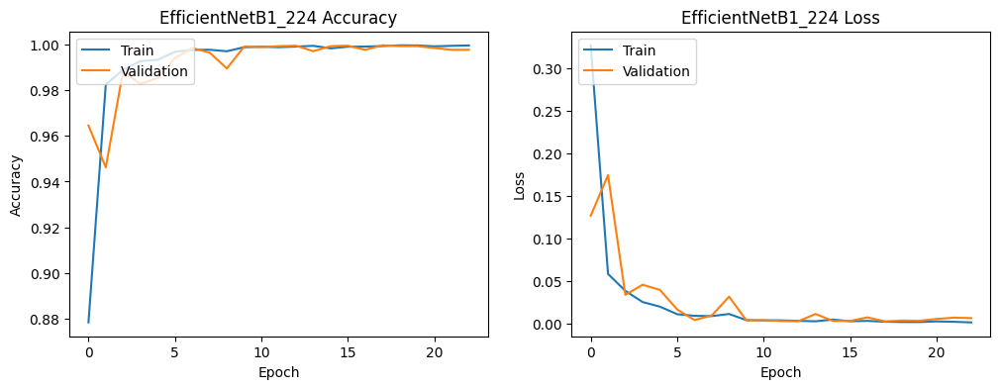

In [27]:
callbacks_eb1 = create_callbacks(
    model_name='EfficientNetB1_224',
    checkpoint_path=checkpoint_path,
    patience=5,       
)

efficientnet_b1 = create_model(EfficientNetB1, input_shape=(224, 224, 3))

history_b1, model_b1 = train_and_plot(efficientnet_b1, 'EfficientNetB1_224', train_generator_with_aug, val_generator, callbacks_eb1,epochs=25)

16/16 [==============================] - 14s 846ms/step
Classification Report:
               precision    recall  f1-score   support

   colon_aca     1.0000    1.0000    1.0000       400
     colon_n     1.0000    1.0000    1.0000       400
    lung_aca     1.0000    1.0000    1.0000       400
      lung_n     1.0000    1.0000    1.0000       400
    lung_scc     1.0000    1.0000    1.0000       400

    accuracy                         1.0000      2000
   macro avg     1.0000    1.0000    1.0000      2000
weighted avg     1.0000    1.0000    1.0000      2000



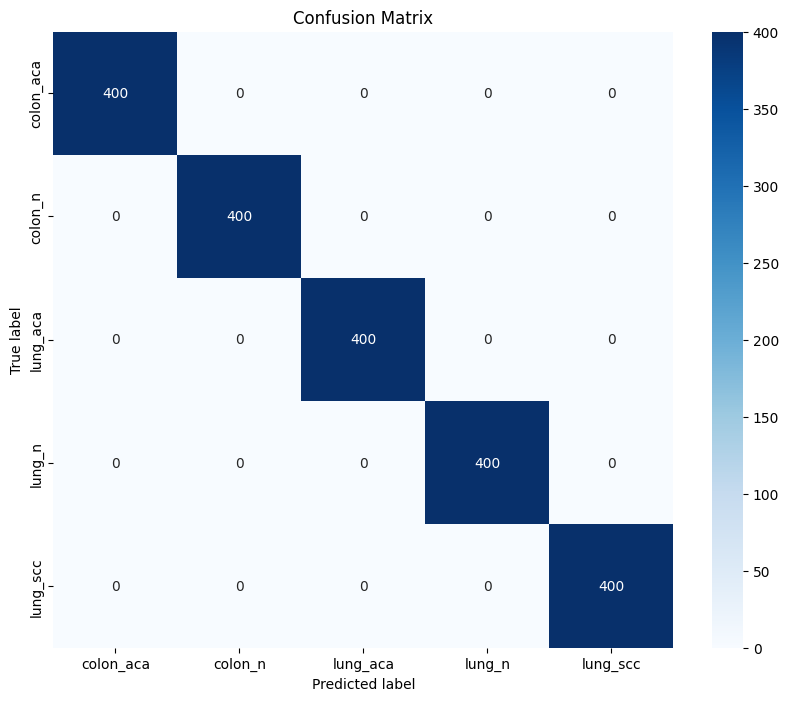

In [29]:
# Call the function after you have trained your model
report_file, cm_file = show_cm_and_classification_report(model_b1, test_generator, 'EfficientNetB1_224')

In [11]:
def create_model_lung(base_model_class, input_shape):
    base_model = base_model_class(input_shape=input_shape, include_top=False, weights='imagenet')
    base_model.trainable = True  # Freeze the base model

    total_layers = len(base_model.layers)
    for layer in base_model.layers[(int(0.5 * total_layers)):]:
        layer.trainable =  False

    inputs = Input(shape=input_shape)
    # Tidak perlu preprocessing lagi di sini
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.5)(x)

    outputs = Dense(3, activation='softmax')(x)

    model = Model(base_model.inputs, outputs)

    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model


In [38]:
train_generator_no_aug, train_generator_with_aug, val_generator, test_generator = create_image_generators(
    train_dir=train_lung_dir,
    val_dir=val_lung_dir,
    test_dir=test_lung_dir,
    target_size=(224, 224),  # Image size
    batch_size=128,           # Batch size
    preprocessing_func=preprocess_input_func  # Optional preprocessing function (e.g., for VGG16 or other models)
)

Found 10800 images belonging to 3 classes.
Found 10800 images belonging to 3 classes.
Found 3000 images belonging to 3 classes.
Found 1200 images belonging to 3 classes.


Epoch 1/25


2024-11-05 18:27:52.321814: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


85/85 [==============================] - ETA: 0s - loss: 0.2902 - accuracy: 0.8880
Epoch 1: val_accuracy improved from -inf to 0.97600, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB2_lung.h5


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


85/85 [==============================] - 144s 2s/step - loss: 0.2902 - accuracy: 0.8880 - val_loss: 0.0829 - val_accuracy: 0.9760 - lr: 0.0010
Epoch 2/25
85/85 [==============================] - ETA: 0s - loss: 0.0718 - accuracy: 0.9773
Epoch 2: val_accuracy improved from 0.97600 to 0.97667, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB2_lung.h5
85/85 [==============================] - 97s 1s/step - loss: 0.0718 - accuracy: 0.9773 - val_loss: 0.0664 - val_accuracy: 0.9767 - lr: 0.0010
Epoch 3/25
85/85 [==============================] - ETA: 0s - loss: 0.0325 - accuracy: 0.9904
Epoch 3: val_accuracy improved from 0.97667 to 0.99267, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB2_lung.h5
85/85 [==============================] - 93s 1s/step - loss: 0.0325 - accuracy: 0.9904 - val_loss: 0.0236 - val_accuracy: 0.9927 - lr: 0.0010
Epoch 4/25
85/85 [==============================] - ETA: 0s - loss: 0.0291 - accuracy: 0.9910
Epoch 4

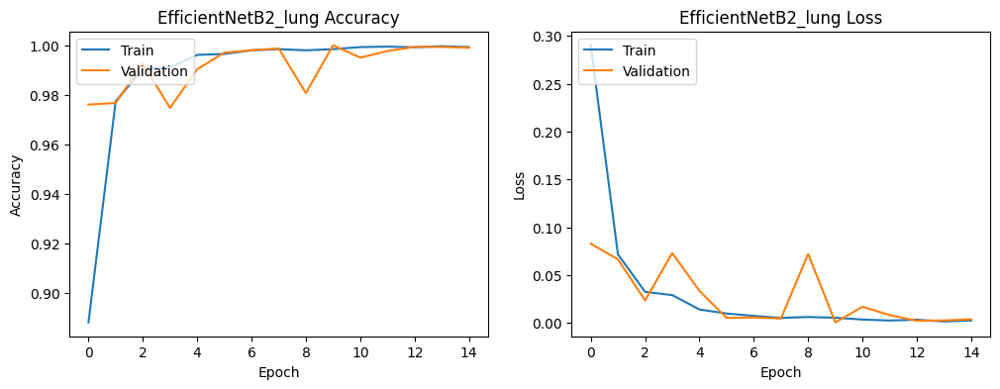

In [42]:
callbacks_eb2_lung = create_callbacks(
    model_name='EfficientNetB2_lung',
    checkpoint_path=checkpoint_path,
    patience=5,       
)

efficientnet_b2_lung = create_model_lung(EfficientNetB2, input_shape=(224, 224, 3))

history_b2_lung, model_b2_lung = train_and_plot(efficientnet_b2_lung, 'EfficientNetB2_lung', train_generator_with_aug, val_generator, callbacks_eb2_lung,epochs=25)

10/10 [==============================] - 9s 832ms/step
Classification Report:
               precision    recall  f1-score   support

    lung_aca     1.0000    1.0000    1.0000       400
      lung_n     1.0000    1.0000    1.0000       400
    lung_scc     1.0000    1.0000    1.0000       400

    accuracy                         1.0000      1200
   macro avg     1.0000    1.0000    1.0000      1200
weighted avg     1.0000    1.0000    1.0000      1200



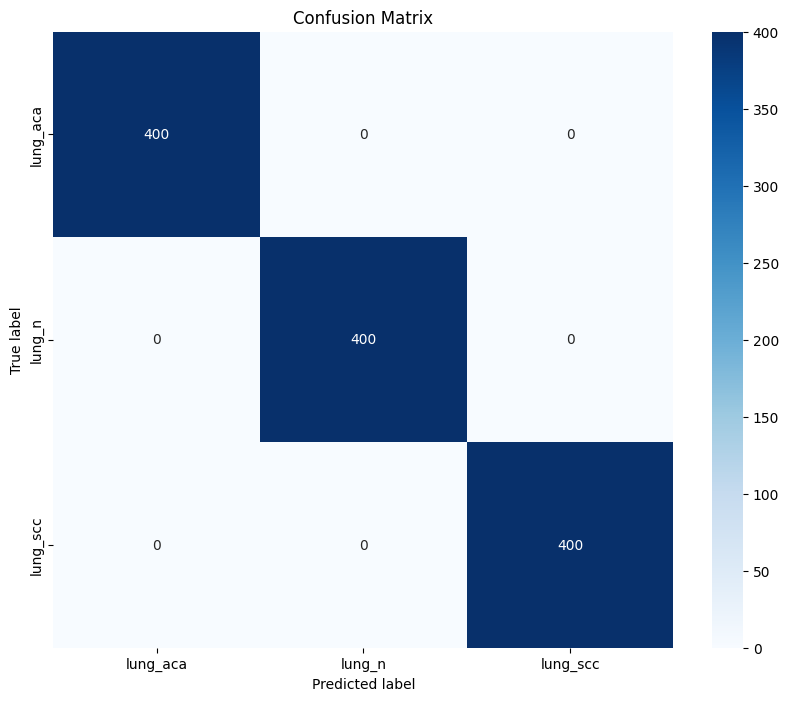

In [43]:
# Call the function after you have trained your model
report_file, cm_file = show_cm_and_classification_report(model_b2_lung, test_generator, 'EfficientNetB2_lung')

In [46]:
train_generator_no_aug, train_generator_with_aug, val_generator, test_generator = create_image_generators(
    train_dir=train_dir,
    val_dir=val_dir,
    test_dir=test_dir,
    target_size=(224, 224),  # Image size
    batch_size=128,           # Batch size
    preprocessing_func=preprocess_input_func  # Optional preprocessing function (e.g., for VGG16 or other models)
)

Found 18000 images belonging to 5 classes.
Found 18000 images belonging to 5 classes.
Found 5000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.


Epoch 1/25


2024-11-05 18:58:45.675769: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_5/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


141/141 [==============================] - ETA: 0s - loss: 0.3140 - accuracy: 0.8812
Epoch 1: val_accuracy improved from -inf to 0.97400, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB2_224.h5


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


141/141 [==============================] - 232s 2s/step - loss: 0.3140 - accuracy: 0.8812 - val_loss: 0.0914 - val_accuracy: 0.9740 - lr: 0.0010
Epoch 2/25
141/141 [==============================] - ETA: 0s - loss: 0.0641 - accuracy: 0.9809
Epoch 2: val_accuracy did not improve from 0.97400
141/141 [==============================] - 208s 1s/step - loss: 0.0641 - accuracy: 0.9809 - val_loss: 0.2433 - val_accuracy: 0.9342 - lr: 0.0010
Epoch 3/25
141/141 [==============================] - ETA: 0s - loss: 0.0388 - accuracy: 0.9904
Epoch 3: val_accuracy did not improve from 0.97400

Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
141/141 [==============================] - 207s 1s/step - loss: 0.0388 - accuracy: 0.9904 - val_loss: 0.2627 - val_accuracy: 0.9286 - lr: 0.0010
Epoch 4/25
141/141 [==============================] - ETA: 0s - loss: 0.0147 - accuracy: 0.9963
Epoch 4: val_accuracy improved from 0.97400 to 0.98060, saving model to /workspace/TelU-TugasAkhir

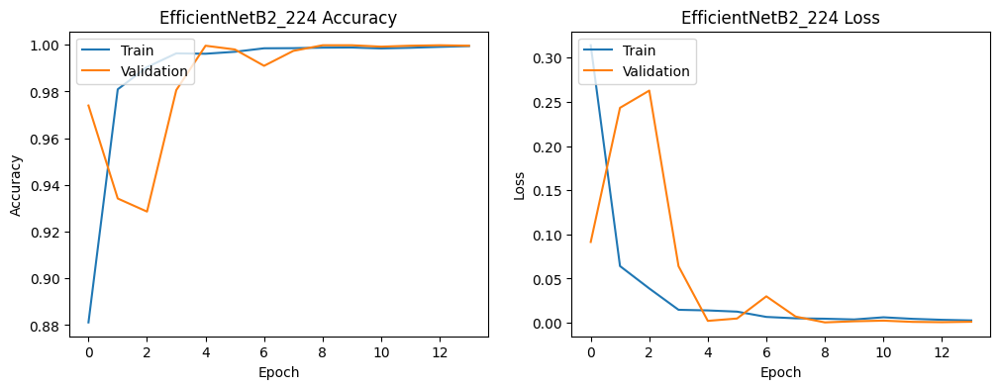

In [47]:
callbacks_eb2 = create_callbacks(
    model_name='EfficientNetB2_224',
    checkpoint_path=checkpoint_path,
    patience=5,       
)

efficientnet_b2 = create_model(EfficientNetB2, input_shape=(224, 224, 3))

history_b2, model_b2 = train_and_plot(efficientnet_b2, 'EfficientNetB2_224', train_generator_with_aug, val_generator, callbacks_eb2,epochs=25)

16/16 [==============================] - 13s 808ms/step
Classification Report:
               precision    recall  f1-score   support

   colon_aca     1.0000    1.0000    1.0000       400
     colon_n     1.0000    1.0000    1.0000       400
    lung_aca     1.0000    1.0000    1.0000       400
      lung_n     1.0000    1.0000    1.0000       400
    lung_scc     1.0000    1.0000    1.0000       400

    accuracy                         1.0000      2000
   macro avg     1.0000    1.0000    1.0000      2000
weighted avg     1.0000    1.0000    1.0000      2000



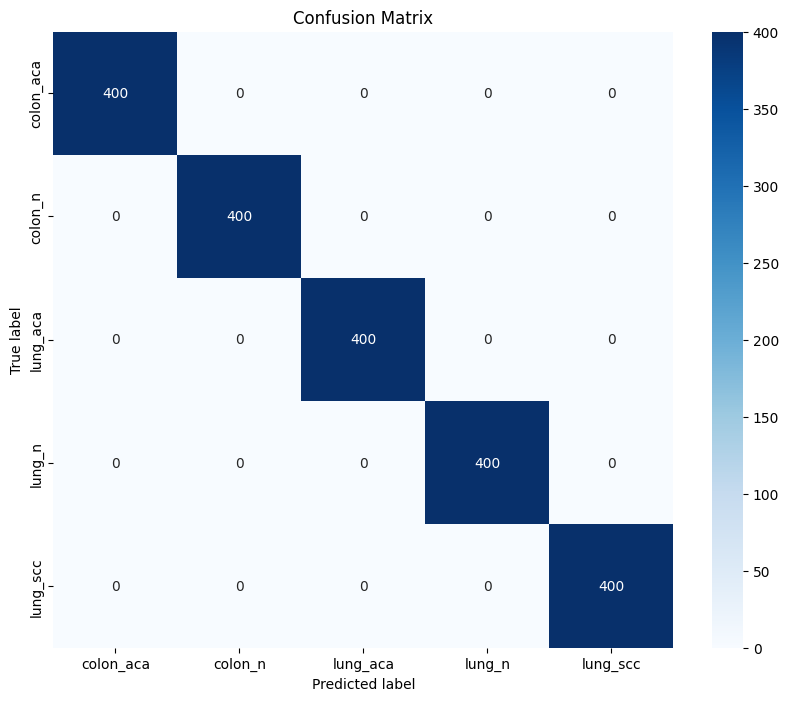

In [48]:
# Call the function after you have trained your model
report_file, cm_file = show_cm_and_classification_report(model_b2, test_generator, 'EfficientNetB2_224')

In [51]:
train_generator_no_aug, train_generator_with_aug, val_generator, test_generator = create_image_generators(
    train_dir=train_dir,
    val_dir=val_dir,
    test_dir=test_dir,
    target_size=(380, 380),  # Image size
    batch_size=32,           # Batch size
    preprocessing_func=preprocess_input_func  # Optional preprocessing function (e.g., for VGG16 or other models)
)

Found 18000 images belonging to 5 classes.
Found 18000 images belonging to 5 classes.
Found 5000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.


Epoch 1/25


2024-11-05 20:01:12.019406: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_7/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


563/563 [==============================] - ETA: 0s - loss: 0.1920 - accuracy: 0.9338
Epoch 1: val_accuracy improved from -inf to 0.99360, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB4.h5


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


563/563 [==============================] - 389s 665ms/step - loss: 0.1920 - accuracy: 0.9338 - val_loss: 0.0185 - val_accuracy: 0.9936 - lr: 0.0010
Epoch 2/25
563/563 [==============================] - ETA: 0s - loss: 0.0660 - accuracy: 0.9809
Epoch 2: val_accuracy did not improve from 0.99360
563/563 [==============================] - 367s 652ms/step - loss: 0.0660 - accuracy: 0.9809 - val_loss: 0.0314 - val_accuracy: 0.9890 - lr: 0.0010
Epoch 3/25
563/563 [==============================] - ETA: 0s - loss: 0.0445 - accuracy: 0.9868
Epoch 3: val_accuracy did not improve from 0.99360
563/563 [==============================] - 360s 638ms/step - loss: 0.0445 - accuracy: 0.9868 - val_loss: 0.0183 - val_accuracy: 0.9922 - lr: 0.0010
Epoch 4/25
563/563 [==============================] - ETA: 0s - loss: 0.0358 - accuracy: 0.9906
Epoch 4: val_accuracy improved from 0.99360 to 0.99600, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB4.h5
563/563 [====================

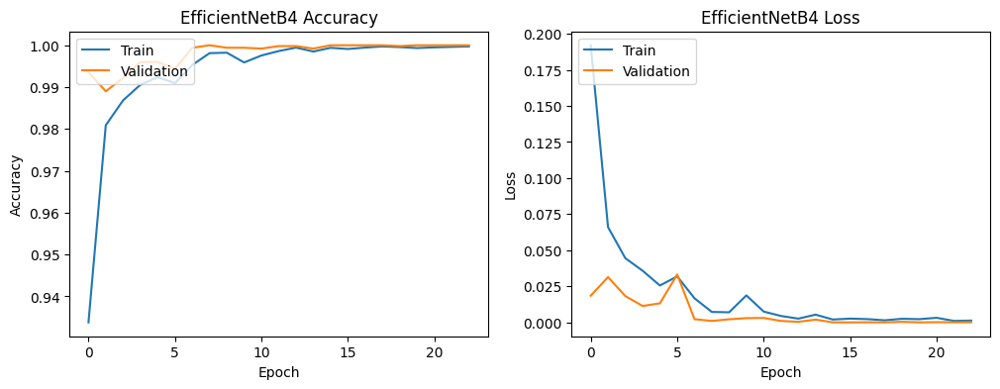

In [52]:
callbacks_eb4 = create_callbacks(
    model_name='EfficientNetB4',
    checkpoint_path=checkpoint_path,
    patience=5,       
)

efficientnet_b4 = create_model(EfficientNetB4, input_shape=(380, 380, 3))

history_b4, model_b4 = train_and_plot(efficientnet_b4, 'EfficientNetB4', train_generator_with_aug, val_generator, callbacks_eb4,epochs=25)

63/63 [==============================] - 17s 251ms/step
Classification Report:
               precision    recall  f1-score   support

   colon_aca     1.0000    1.0000    1.0000       400
     colon_n     1.0000    1.0000    1.0000       400
    lung_aca     1.0000    1.0000    1.0000       400
      lung_n     1.0000    1.0000    1.0000       400
    lung_scc     1.0000    1.0000    1.0000       400

    accuracy                         1.0000      2000
   macro avg     1.0000    1.0000    1.0000      2000
weighted avg     1.0000    1.0000    1.0000      2000



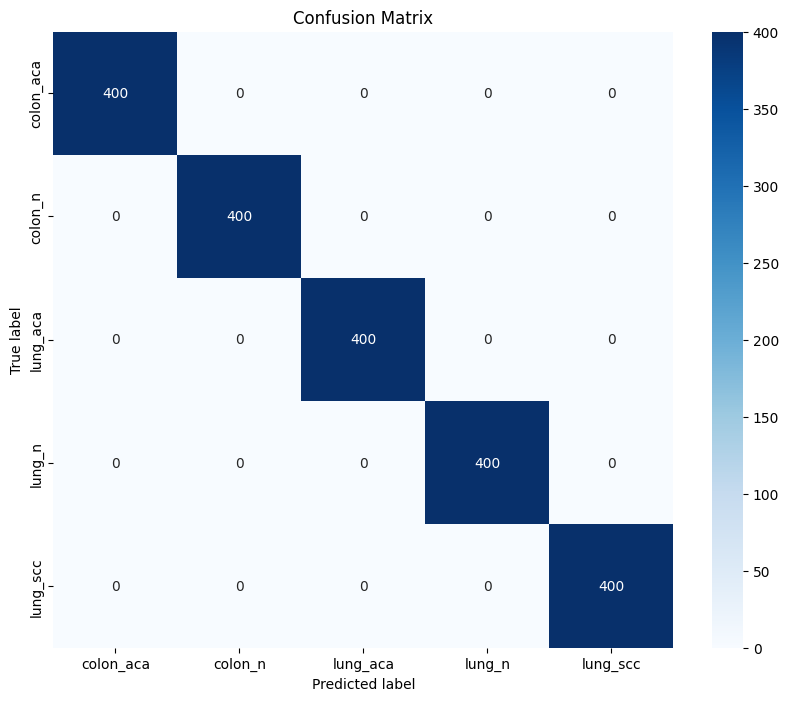

In [53]:
# Call the function after you have trained your model
report_file, cm_file = show_cm_and_classification_report(model_b4, test_generator, 'EfficientNetB4')

In [54]:
train_generator_no_aug, train_generator_with_aug, val_generator, test_generator = create_image_generators(
    train_dir=train_dir,
    val_dir=val_dir,
    test_dir=test_dir,
    target_size=(456, 456),  # Image size
    batch_size=16,           # Batch size
    preprocessing_func=preprocess_input_func  # Optional preprocessing function (e.g., for VGG16 or other models)
)

Found 18000 images belonging to 5 classes.
Found 18000 images belonging to 5 classes.
Found 5000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.


115263384/115263384 [==============================] - 5s 0us/step
Epoch 1/25


2024-11-05 22:23:22.860601: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_8/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


 857/1125 [=====================>........] - ETA: 1:42 - loss: 0.2488 - accuracy: 0.9122
Epoch 1: val_accuracy improved from -inf to 0.98940, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB5.h5


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1125/1125 [==============================] - 497s 426ms/step - loss: 0.2146 - accuracy: 0.9253 - val_loss: 0.0472 - val_accuracy: 0.9894 - lr: 0.0010
Epoch 2/25
1125/1125 [==============================] - ETA: 0s - loss: 0.0830 - accuracy: 0.9730
Epoch 2: val_accuracy did not improve from 0.98940
1125/1125 [==============================] - 472s 419ms/step - loss: 0.0830 - accuracy: 0.9730 - val_loss: 0.0513 - val_accuracy: 0.9774 - lr: 0.0010
Epoch 3/25
1125/1125 [==============================] - ETA: 0s - loss: 0.0576 - accuracy: 0.9818
Epoch 3: val_accuracy improved from 0.98940 to 0.99060, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB5.h5
1125/1125 [==============================] - 467s 415ms/step - loss: 0.0576 - accuracy: 0.9818 - val_loss: 0.0236 - val_accuracy: 0.9906 - lr: 0.0010
Epoch 4/25
 740/1125 [==================>...........] - ETA: 2:26 - loss: 0.0595 - accuracy: 0.9823

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)




Epoch 7: val_accuracy did not improve from 0.99700
1125/1125 [==============================] - 466s 414ms/step - loss: 0.0164 - accuracy: 0.9951 - val_loss: 0.0102 - val_accuracy: 0.9964 - lr: 5.0000e-04
Epoch 8/25
1125/1125 [==============================] - ETA: 0s - loss: 0.0185 - accuracy: 0.9947
Epoch 8: val_accuracy did not improve from 0.99700

Epoch 8: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
1125/1125 [==============================] - 467s 415ms/step - loss: 0.0185 - accuracy: 0.9947 - val_loss: 0.0123 - val_accuracy: 0.9960 - lr: 5.0000e-04
Epoch 9/25
1125/1125 [==============================] - ETA: 0s - loss: 0.0084 - accuracy: 0.9978
Epoch 9: val_accuracy improved from 0.99700 to 0.99940, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB5.h5
1125/1125 [==============================] - 465s 413ms/step - loss: 0.0084 - accuracy: 0.9978 - val_loss: 0.0017 - val_accuracy: 0.9994 - lr: 2.5000e-04
Epoch 10/25
1125/1125 [==

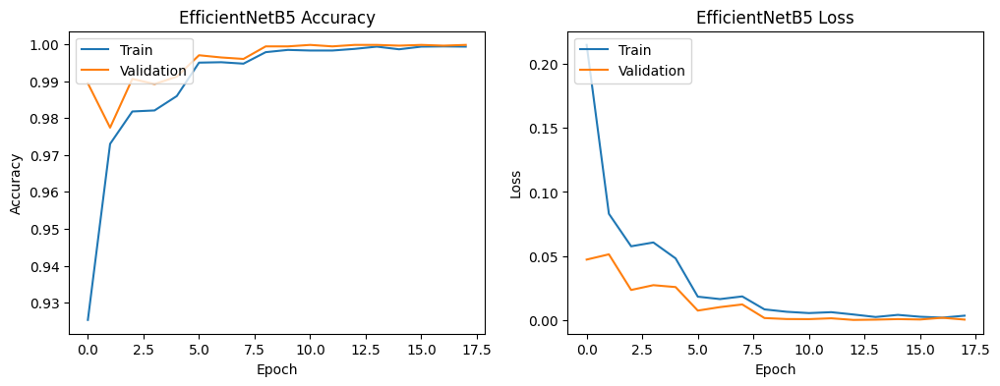

In [55]:
callbacks_eb5 = create_callbacks(
    model_name='EfficientNetB5',
    checkpoint_path=checkpoint_path,
    patience=5,       
)

efficientnet_b5 = create_model(EfficientNetB5, input_shape=(456, 456, 3))

history_b5, model_b5 = train_and_plot(efficientnet_b5, 'EfficientNetB5', train_generator_with_aug, val_generator, callbacks_eb5,epochs=25)

125/125 [==============================] - 18s 137ms/step
Classification Report:
               precision    recall  f1-score   support

   colon_aca     1.0000    1.0000    1.0000       400
     colon_n     1.0000    1.0000    1.0000       400
    lung_aca     1.0000    1.0000    1.0000       400
      lung_n     1.0000    1.0000    1.0000       400
    lung_scc     1.0000    1.0000    1.0000       400

    accuracy                         1.0000      2000
   macro avg     1.0000    1.0000    1.0000      2000
weighted avg     1.0000    1.0000    1.0000      2000



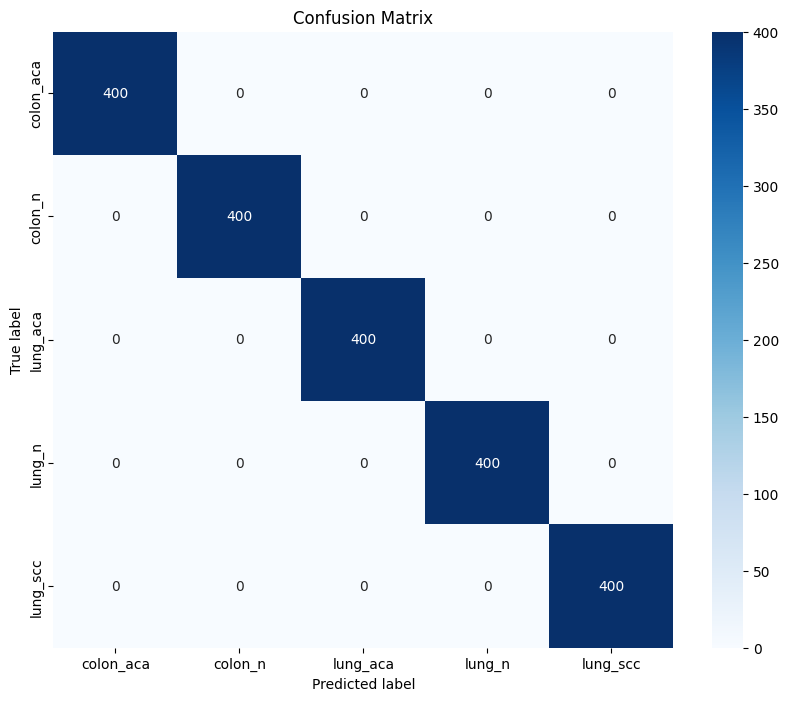

In [56]:
# Call the function after you have trained your model
report_file, cm_file = show_cm_and_classification_report(model_b5, test_generator, 'EfficientNetB5')

In [57]:
train_generator_no_aug, train_generator_with_aug, val_generator, test_generator = create_image_generators(
    train_dir=train_dir,
    val_dir=val_dir,
    test_dir=test_dir,
    target_size=(512, 512),  # Image size
    batch_size=8,           # Batch size
    preprocessing_func=preprocess_input_func  # Optional preprocessing function (e.g., for VGG16 or other models)
)

Found 18000 images belonging to 5 classes.
Found 18000 images belonging to 5 classes.
Found 5000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.


165234480/165234480 [==============================] - 7s 0us/step
Epoch 1/25


2024-11-06 00:45:11.026834: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_9/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


2250/2250 [==============================] - ETA: 0s - loss: 0.2289 - accuracy: 0.9253
Epoch 1: val_accuracy improved from -inf to 0.98320, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB6.h5


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


2250/2250 [==============================] - 709s 306ms/step - loss: 0.2289 - accuracy: 0.9253 - val_loss: 0.0457 - val_accuracy: 0.9832 - lr: 0.0010
Epoch 2/25
2250/2250 [==============================] - ETA: 0s - loss: 0.1252 - accuracy: 0.9611
Epoch 2: val_accuracy did not improve from 0.98320
2250/2250 [==============================] - 685s 305ms/step - loss: 0.1252 - accuracy: 0.9611 - val_loss: 0.0623 - val_accuracy: 0.9758 - lr: 0.0010
Epoch 3/25
2250/2250 [==============================] - ETA: 0s - loss: 0.0931 - accuracy: 0.9712
Epoch 3: val_accuracy did not improve from 0.98320

Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
2250/2250 [==============================] - 686s 305ms/step - loss: 0.0931 - accuracy: 0.9712 - val_loss: 0.0533 - val_accuracy: 0.9774 - lr: 0.0010
Epoch 4/25
2250/2250 [==============================] - ETA: 0s - loss: 0.0490 - accuracy: 0.9840
Epoch 4: val_accuracy improved from 0.98320 to 0.98340, saving model to /work

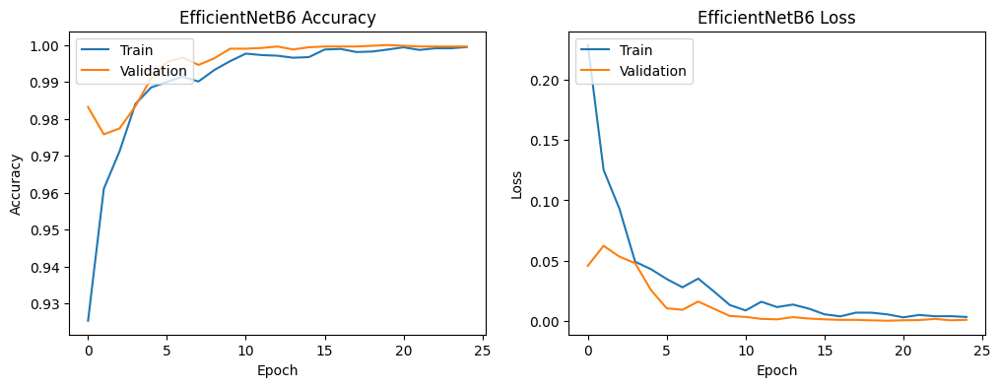

In [58]:
callbacks_eb6 = create_callbacks(
    model_name='EfficientNetB6',
    checkpoint_path=checkpoint_path,
    patience=5,       
)

efficientnet_b6 = create_model(EfficientNetB6, input_shape=(512, 512, 3))

history_b6, model_b6 = train_and_plot(efficientnet_b6, 'EfficientNetB6', train_generator_with_aug, val_generator, callbacks_eb6,epochs=25)

250/250 [==============================] - 17s 65ms/step
Classification Report:
               precision    recall  f1-score   support

   colon_aca     1.0000    1.0000    1.0000       400
     colon_n     1.0000    1.0000    1.0000       400
    lung_aca     1.0000    1.0000    1.0000       400
      lung_n     1.0000    1.0000    1.0000       400
    lung_scc     1.0000    1.0000    1.0000       400

    accuracy                         1.0000      2000
   macro avg     1.0000    1.0000    1.0000      2000
weighted avg     1.0000    1.0000    1.0000      2000



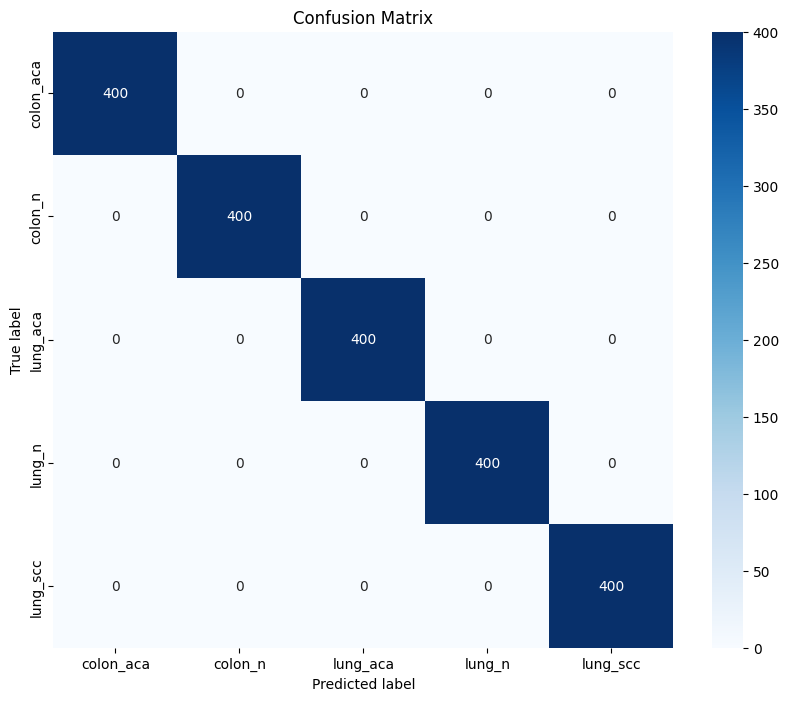

In [59]:
# Call the function after you have trained your model
report_file, cm_file = show_cm_and_classification_report(model_b6, test_generator, 'EfficientNetB6')

In [15]:
train_generator_no_aug, train_generator_with_aug, val_generator, test_generator = create_image_generators(
    train_dir=train_dir,
    val_dir=val_dir,
    test_dir=test_dir,
    target_size=(224, 224),  # Image size
    batch_size=64,           # Batch size
    preprocessing_func=preprocess_input_func  # Optional preprocessing function (e.g., for VGG16 or other models)
)

Found 18000 images belonging to 5 classes.
Found 18000 images belonging to 5 classes.
Found 5000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.


In [16]:
# Record the start time
start_time = time.time()

Epoch 1/25


2024-11-06 15:45:25.097591: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_2/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


282/282 [==============================] - ETA: 0s - loss: 0.2252 - accuracy: 0.9194
Epoch 1: val_accuracy improved from -inf to 0.95340, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB3_224.h5


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


282/282 [==============================] - 249s 842ms/step - loss: 0.2252 - accuracy: 0.9194 - val_loss: 0.1924 - val_accuracy: 0.9534 - lr: 0.0010
Epoch 2/25
282/282 [==============================] - ETA: 0s - loss: 0.0675 - accuracy: 0.9817
Epoch 2: val_accuracy improved from 0.95340 to 0.97220, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB3_224.h5
282/282 [==============================] - 226s 801ms/step - loss: 0.0675 - accuracy: 0.9817 - val_loss: 0.1048 - val_accuracy: 0.9722 - lr: 0.0010
Epoch 3/25
282/282 [==============================] - ETA: 0s - loss: 0.0404 - accuracy: 0.9877
Epoch 3: val_accuracy improved from 0.97220 to 0.99060, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB3_224.h5
282/282 [==============================] - 225s 797ms/step - loss: 0.0404 - accuracy: 0.9877 - val_loss: 0.0344 - val_accuracy: 0.9906 - lr: 0.0010
Epoch 4/25
282/282 [==============================] - ETA: 0s - loss: 0.0457 - acc

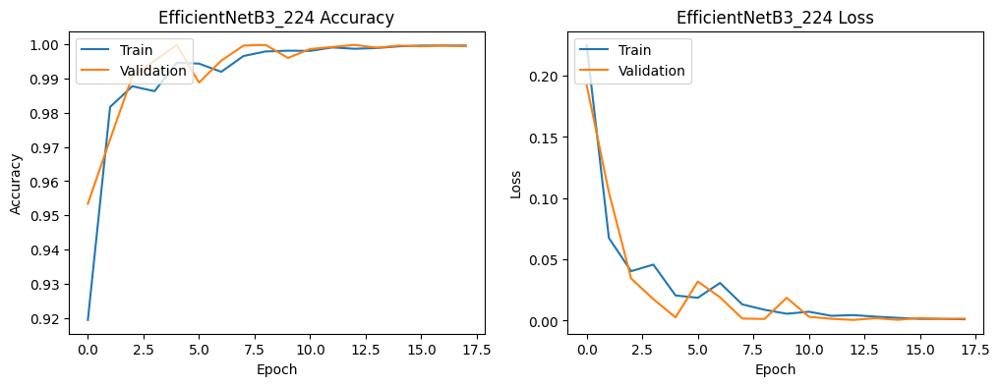

In [17]:
callbacks_eb3 = create_callbacks(
    model_name='EfficientNetB3_224',
    checkpoint_path=checkpoint_path,
    patience=5,       
)

efficientnet_b3 = create_model(EfficientNetB3, input_shape=(224, 224, 3))

history_b3_224, model_b3_224 = train_and_plot(efficientnet_b3, 'EfficientNetB3_224', train_generator_with_aug, val_generator, callbacks_eb3,epochs=25)

In [18]:
# Record the end time
end_time = time.time()

# Calculate and print the training time
training_time = end_time - start_time
print(f"Training time: {training_time / 60:.2f} minutes")

Training time: 65.63 minutes


32/32 [==============================] - 15s 446ms/step
Classification Report:
               precision    recall  f1-score   support

   colon_aca     0.9975    1.0000    0.9988       400
     colon_n     1.0000    0.9975    0.9987       400
    lung_aca     1.0000    1.0000    1.0000       400
      lung_n     1.0000    1.0000    1.0000       400
    lung_scc     1.0000    1.0000    1.0000       400

    accuracy                         0.9995      2000
   macro avg     0.9995    0.9995    0.9995      2000
weighted avg     0.9995    0.9995    0.9995      2000



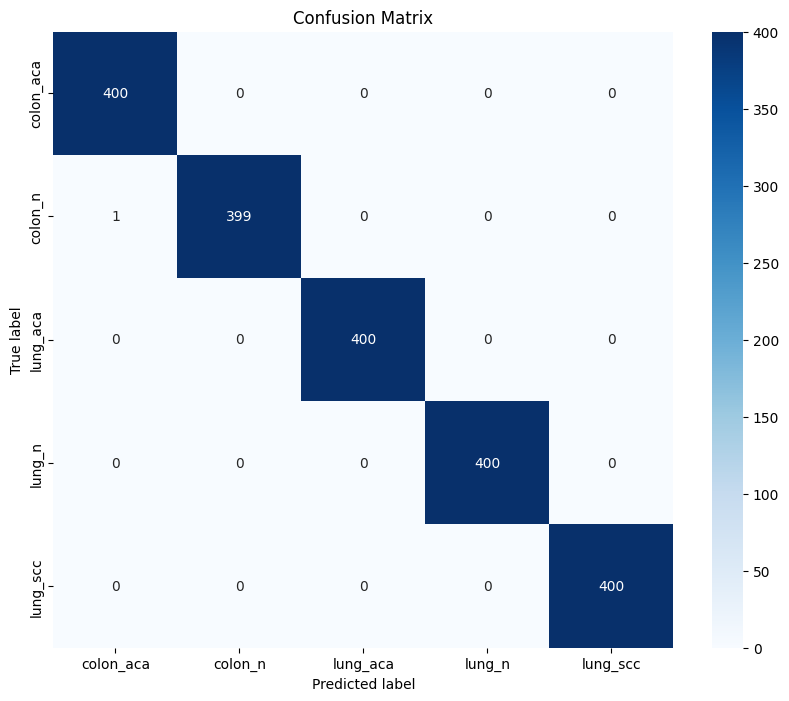

In [19]:
# Call the function after you have trained your model
report_file, cm_file = show_cm_and_classification_report(model_b3_224, test_generator, 'EfficientNetB3_224')

In [20]:
train_generator_no_aug, train_generator_with_aug, val_generator, test_generator = create_image_generators(
    train_dir=train_dir,
    val_dir=val_dir,
    test_dir=test_dir,
    target_size=(224, 224),  # Image size
    batch_size=64,           # Batch size
    preprocessing_func=preprocess_input_func  # Optional preprocessing function (e.g., for VGG16 or other models)
)

Found 18000 images belonging to 5 classes.
Found 18000 images belonging to 5 classes.
Found 5000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.


In [21]:
# Record the start time
start_time = time.time()

71686520/71686520 [==============================] - 3s 0us/step
Epoch 1/25


2024-11-06 16:59:56.036537: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_3/block1b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


282/282 [==============================] - ETA: 0s - loss: 0.2639 - accuracy: 0.9023
Epoch 1: val_accuracy improved from -inf to 0.97420, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB4_224.h5


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


282/282 [==============================] - 247s 823ms/step - loss: 0.2639 - accuracy: 0.9023 - val_loss: 0.0763 - val_accuracy: 0.9742 - lr: 0.0010
Epoch 2/25
282/282 [==============================] - ETA: 0s - loss: 0.0681 - accuracy: 0.9793
Epoch 2: val_accuracy improved from 0.97420 to 0.97980, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB4_224.h5
282/282 [==============================] - 196s 695ms/step - loss: 0.0681 - accuracy: 0.9793 - val_loss: 0.0543 - val_accuracy: 0.9798 - lr: 0.0010
Epoch 3/25
282/282 [==============================] - ETA: 0s - loss: 0.0362 - accuracy: 0.9899
Epoch 3: val_accuracy improved from 0.97980 to 0.99100, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB4_224.h5
282/282 [==============================] - 173s 615ms/step - loss: 0.0362 - accuracy: 0.9899 - val_loss: 0.0235 - val_accuracy: 0.9910 - lr: 0.0010
Epoch 4/25
282/282 [==============================] - ETA: 0s - loss: 0.0399 - acc

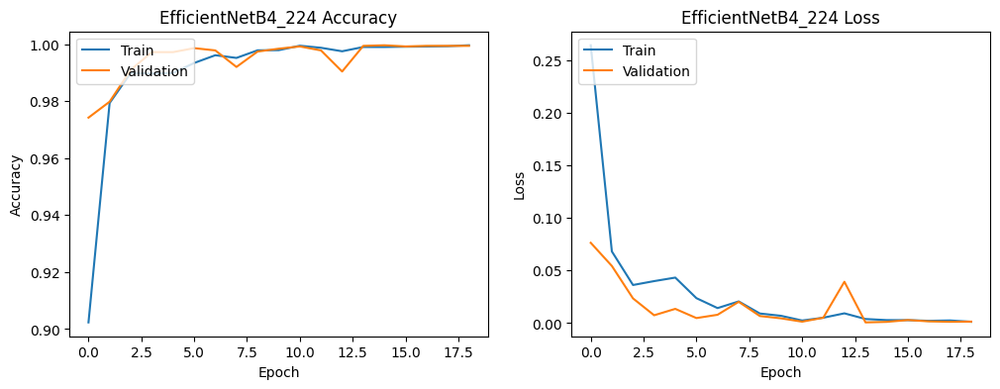

In [22]:
callbacks_eb4 = create_callbacks(
    model_name='EfficientNetB4_224',
    checkpoint_path=checkpoint_path,
    patience=5,       
)

efficientnet_b4 = create_model(EfficientNetB4, input_shape=(224, 224, 3))

history_b4_224, model_b4_224 = train_and_plot(efficientnet_b4, 'EfficientNetB4_224', train_generator_with_aug, val_generator, callbacks_eb4,epochs=25)

In [23]:
# Record the end time
end_time = time.time()

# Calculate and print the training time
training_time = end_time - start_time
print(f"Training time: {training_time / 60:.2f} minutes")

Training time: 57.12 minutes


32/32 [==============================] - 13s 422ms/step
Classification Report:
               precision    recall  f1-score   support

   colon_aca     0.9975    1.0000    0.9988       400
     colon_n     1.0000    0.9975    0.9987       400
    lung_aca     1.0000    1.0000    1.0000       400
      lung_n     1.0000    1.0000    1.0000       400
    lung_scc     1.0000    1.0000    1.0000       400

    accuracy                         0.9995      2000
   macro avg     0.9995    0.9995    0.9995      2000
weighted avg     0.9995    0.9995    0.9995      2000



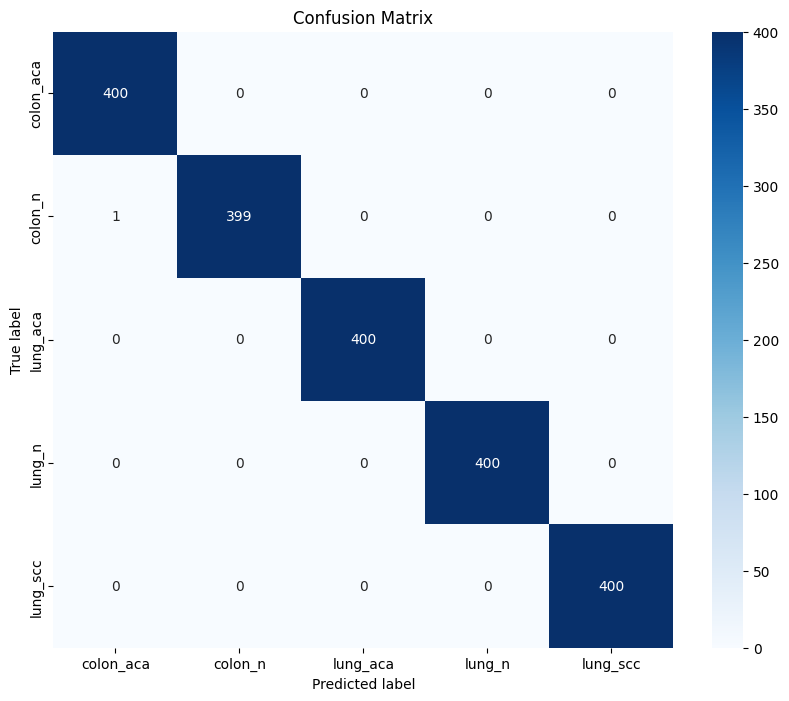

In [24]:
# Call the function after you have trained your model
report_file, cm_file = show_cm_and_classification_report(model_b3_224, test_generator, 'EfficientNetB3_224')

In [26]:
train_generator_no_aug, train_generator_with_aug, val_generator, test_generator = create_image_generators(
    train_dir=train_dir,
    val_dir=val_dir,
    test_dir=test_dir,
    target_size=(224, 224),  # Image size
    batch_size=64,           # Batch size
    preprocessing_func=preprocess_input_func  # Optional preprocessing function (e.g., for VGG16 or other models)
)

Found 18000 images belonging to 5 classes.
Found 18000 images belonging to 5 classes.
Found 5000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.


In [27]:
# Record the start time
start_time = time.time()

Epoch 1/50


2024-11-06 18:11:52.779862: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_4/dropout_8/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


282/282 [==============================] - ETA: 0s - loss: 1.7485 - accuracy: 0.7698
Epoch 1: val_accuracy improved from -inf to 0.64500, saving model to /workspace/TelU-TugasAkhir/model/weights/model_BaseCNN_no_aug.h5


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


282/282 [==============================] - 161s 562ms/step - loss: 1.7485 - accuracy: 0.7698 - val_loss: 0.8884 - val_accuracy: 0.6450 - lr: 0.0010
Epoch 2/50
282/282 [==============================] - ETA: 0s - loss: 0.2630 - accuracy: 0.8966
Epoch 2: val_accuracy improved from 0.64500 to 0.73500, saving model to /workspace/TelU-TugasAkhir/model/weights/model_BaseCNN_no_aug.h5
282/282 [==============================] - 86s 306ms/step - loss: 0.2630 - accuracy: 0.8966 - val_loss: 0.6070 - val_accuracy: 0.7350 - lr: 0.0010
Epoch 3/50
282/282 [==============================] - ETA: 0s - loss: 0.2137 - accuracy: 0.9193
Epoch 3: val_accuracy improved from 0.73500 to 0.91360, saving model to /workspace/TelU-TugasAkhir/model/weights/model_BaseCNN_no_aug.h5
282/282 [==============================] - 87s 307ms/step - loss: 0.2137 - accuracy: 0.9193 - val_loss: 0.2507 - val_accuracy: 0.9136 - lr: 0.0010
Epoch 4/50
282/282 [==============================] - ETA: 0s - loss: 0.1847 - accuracy: 0.9

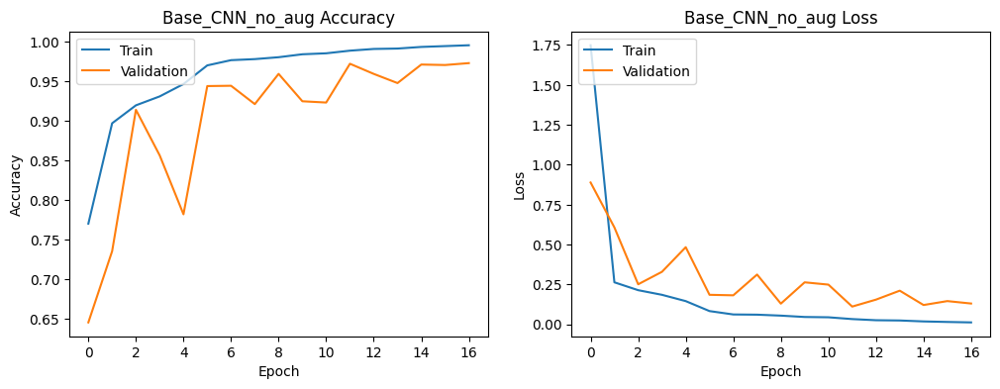

In [28]:
callbacks_base_cnn_no_aug = create_callbacks(
    model_name='BaseCNN_no_aug',
    checkpoint_path=checkpoint_path,
    patience=5,       
)

base_cnn_no_aug = create_base_cnn(input_shape=(224, 224, 3))

history_base_cnn_no_aug, model_base_cnn_no_aug = train_and_plot(base_cnn_no_aug, 'Base_CNN_no_aug', train_generator_no_aug, val_generator, callbacks_base_cnn_no_aug,epochs=50)

In [29]:
# Record the end time
end_time = time.time()

# Calculate and print the training time
training_time = end_time - start_time
print(f"Training time: {training_time / 60:.2f} minutes")

Training time: 26.01 minutes


32/32 [==============================] - 13s 417ms/step
Classification Report:
               precision    recall  f1-score   support

   colon_aca     0.9974    0.9750    0.9861       400
     colon_n     0.9756    0.9975    0.9864       400
    lung_aca     0.9440    0.9700    0.9568       400
      lung_n     0.9975    1.0000    0.9988       400
    lung_scc     0.9716    0.9425    0.9569       400

    accuracy                         0.9770      2000
   macro avg     0.9772    0.9770    0.9770      2000
weighted avg     0.9772    0.9770    0.9770      2000



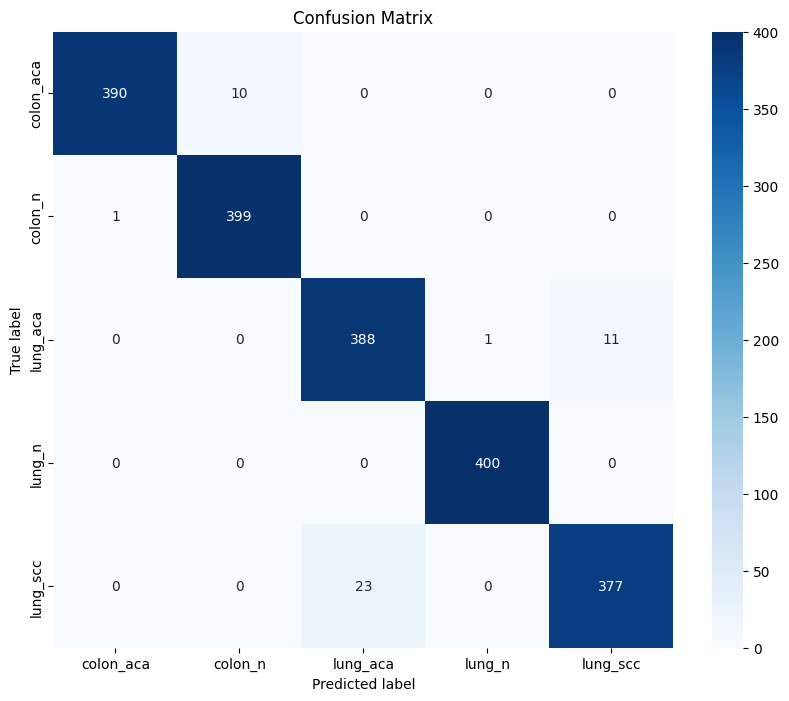

In [30]:
# Call the function after you have trained your model
report_file, cm_file = show_cm_and_classification_report(model_base_cnn_no_aug, test_generator, 'Base_CNN_no_aug')

In [54]:
train_generator_no_aug, train_generator_with_aug, val_generator, test_generator = create_image_generators(
    train_dir=train_dir,
    val_dir=val_dir,
    test_dir=test_dir,
    target_size=(224, 224),  # Image size
    batch_size=64,           # Batch size
    preprocessing_func=preprocess_input_func  # Optional preprocessing function (e.g., for VGG16 or other models)
)

Found 18000 images belonging to 5 classes.
Found 18000 images belonging to 5 classes.
Found 5000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.


In [55]:
# Record the start time
start_time = time.time()

Epoch 1/50


2024-11-06 21:18:04.441400: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_10/dropout_26/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


282/282 [==============================] - ETA: 0s - loss: 2.3985 - accuracy: 0.7138
Epoch 1: val_accuracy improved from -inf to 0.62460, saving model to /workspace/TelU-TugasAkhir/model/weights/model_base_cnn.h5
282/282 [==============================] - 225s 795ms/step - loss: 2.3985 - accuracy: 0.7138 - val_loss: 1.3943 - val_accuracy: 0.6246 - lr: 0.0010
Epoch 2/50
282/282 [==============================] - ETA: 0s - loss: 0.4515 - accuracy: 0.8214
Epoch 2: val_accuracy improved from 0.62460 to 0.64460, saving model to /workspace/TelU-TugasAkhir/model/weights/model_base_cnn.h5
282/282 [==============================] - 180s 640ms/step - loss: 0.4515 - accuracy: 0.8214 - val_loss: 0.6297 - val_accuracy: 0.6446 - lr: 0.0010
Epoch 3/50
282/282 [==============================] - ETA: 0s - loss: 0.3544 - accuracy: 0.8625
Epoch 3: val_accuracy improved from 0.64460 to 0.70040, saving model to /workspace/TelU-TugasAkhir/model/weights/model_base_cnn.h5
282/282 [============================

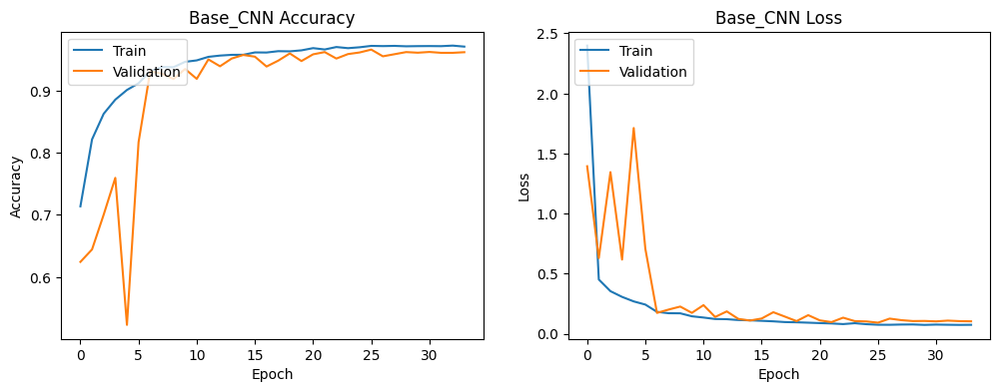

In [56]:
callbacks_base_cnn = create_callbacks(
    model_name='base_cnn',
    checkpoint_path=checkpoint_path,
    patience=8,       
)

base_cnn = create_base_cnn(input_shape=(224, 224, 3))

history_base_cnn, model_base_cnn = train_and_plot(base_cnn, 'Base_CNN', train_generator_with_aug, val_generator, callbacks_base_cnn,epochs=50)

In [57]:
# Record the end time
end_time = time.time()

# Calculate and print the training time
training_time = end_time - start_time
print(f"Training time: {training_time / 60:.2f} minutes")

Training time: 125.51 minutes


32/32 [==============================] - 13s 404ms/step
Classification Report:
               precision    recall  f1-score   support

   colon_aca     0.9704    0.9825    0.9764       400
     colon_n     0.9803    0.9950    0.9876       400
    lung_aca     0.9629    0.9075    0.9344       400
      lung_n     1.0000    1.0000    1.0000       400
    lung_scc     0.9175    0.9450    0.9310       400

    accuracy                         0.9660      2000
   macro avg     0.9662    0.9660    0.9659      2000
weighted avg     0.9662    0.9660    0.9659      2000



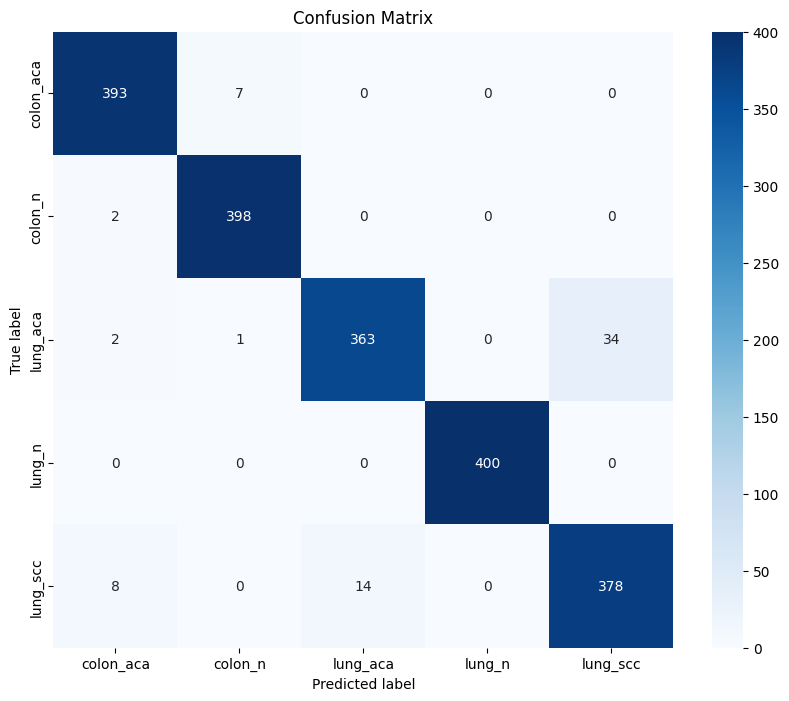

In [58]:
# Call the function after you have trained your model
report_file, cm_file = show_cm_and_classification_report(base_cnn, test_generator, 'Base_CNN')

In [35]:
def add_random_noise(img):
    """Add Gaussian noise to an image."""
    if np.random.rand() > 0.5:
      VARIABILITY = 40
      deviation = VARIABILITY * random.random()
      noise = np.random.normal(0, deviation, img.shape)
      img = img + noise
      img = np.clip(img, 0, 255)
    return img

In [39]:
def create_image_generators_2(train_dir, val_dir, test_dir, target_size=(224, 224), batch_size=32, preprocessing_func=None):
    # ImageDataGenerator without augmentation (for comparison)
    train_datagen_no_aug = ImageDataGenerator()

    # ImageDataGenerator with augmentation
    train_datagen_with_aug = ImageDataGenerator(
        preprocessing_function=add_random_noise,
        horizontal_flip=True,
        vertical_flip=True,  # Flip the images vertically as well
        fill_mode='nearest',  # Strategy to fill newly created pixels
        brightness_range=[0.8, 1.2],  # Adjust brightness between 80% and 120%
    )
    
    # For validation and test sets, we do not apply augmentation
    val_test_datagen = ImageDataGenerator(
        preprocessing_function=preprocessing_func
    )
    
    # Flow images from directories
    train_generator_no_aug = train_datagen_no_aug.flow_from_directory(
        train_dir,
        target_size=target_size,
        batch_size=batch_size,
        shuffle=True,
        class_mode='categorical'
    )
    
    train_generator_with_aug = train_datagen_with_aug.flow_from_directory(
        train_dir,
        target_size=target_size,
        batch_size=batch_size,
        shuffle=True,
        class_mode='categorical'
    )
    
    val_generator = val_test_datagen.flow_from_directory(
        val_dir,
        target_size=target_size,
        batch_size=batch_size,
        shuffle=True,
        class_mode='categorical'
    )
    
    test_generator = val_test_datagen.flow_from_directory(
        test_dir,
        target_size=target_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False
    )
    
    return train_generator_no_aug, train_generator_with_aug, val_generator, test_generator

In [40]:
train_generator_no_aug, train_generator_with_aug, val_generator, test_generator = create_image_generators_2(
    train_dir=train_lung_2_dir,
    val_dir=val_lung_2_dir,
    test_dir=test_lung_2_dir,
    target_size=(224, 224),  # Image size
    batch_size=64,           # Batch size
)

Found 10500 images belonging to 3 classes.
Found 10500 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.


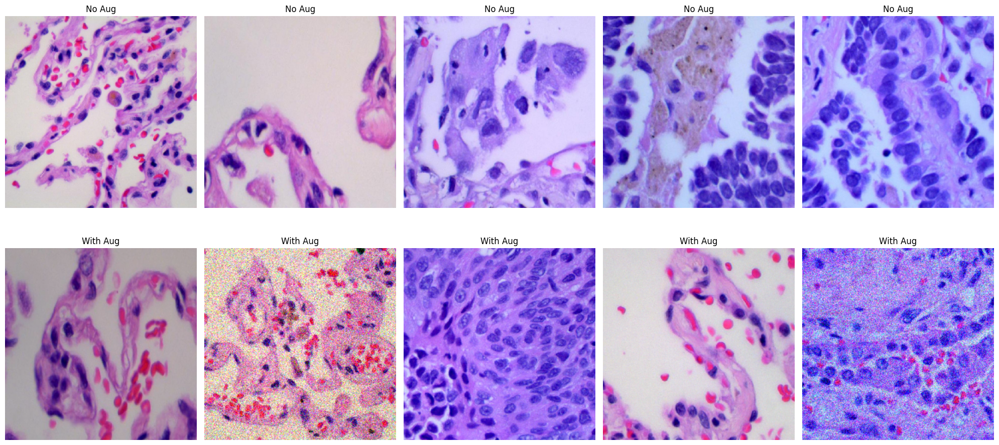

In [42]:
# Get a batch of images from the non-augmented and augmented generators
images_no_aug, _ = next(train_generator_no_aug)
images_aug, _ = next(train_generator_with_aug)

# Plot the first 5 images from both non-augmented and augmented generators
plt.figure(figsize=(20, 10))

for i in range(5):
    # Non-augmented images
    plt.subplot(2, 5, i + 1)
    plt.imshow(images_no_aug[i].astype('uint8'))  # Convert to uint8 if needed
    plt.title("No Aug")
    plt.axis('off')

    # Augmented images
    plt.subplot(2, 5, i + 6)
    plt.imshow(images_aug[i].astype('uint8'))  # Convert to uint8 if needed
    plt.title("With Aug")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [44]:
def create_model_2(base_model_class, input_shape):
    base_model = base_model_class(input_shape=input_shape, include_top=False, weights='imagenet')
    base_model.trainable = True 
    
    inputs = Input(shape=input_shape)
    # Tidak perlu preprocessing lagi di sini
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.5)(x)

    outputs = Dense(3, activation='softmax')(x)

    model = Model(base_model.inputs, outputs)

    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model


Epoch 1/10


2024-11-07 07:28:27.129217: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_5/block2b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


165/165 [==============================] - ETA: 0s - loss: 0.1528 - accuracy: 0.9480
Epoch 1: val_accuracy improved from -inf to 0.95378, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB0_2_no_aug.h5


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


165/165 [==============================] - 94s 500ms/step - loss: 0.1528 - accuracy: 0.9480 - val_loss: 0.2689 - val_accuracy: 0.9538 - lr: 0.0010
Epoch 2/10
165/165 [==============================] - ETA: 0s - loss: 0.0423 - accuracy: 0.9876
Epoch 2: val_accuracy improved from 0.95378 to 0.99022, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB0_2_no_aug.h5
165/165 [==============================] - 45s 275ms/step - loss: 0.0423 - accuracy: 0.9876 - val_loss: 0.0364 - val_accuracy: 0.9902 - lr: 0.0010
Epoch 3/10
165/165 [==============================] - ETA: 0s - loss: 0.0568 - accuracy: 0.9850
Epoch 3: val_accuracy did not improve from 0.99022
165/165 [==============================] - 47s 282ms/step - loss: 0.0568 - accuracy: 0.9850 - val_loss: 1.6178 - val_accuracy: 0.6147 - lr: 0.0010
Epoch 4/10
165/165 [==============================] - ETA: 0s - loss: 0.0818 - accuracy: 0.9751
Epoch 4: val_accuracy did not improve from 0.99022

Epoch 4: ReduceLROnPla

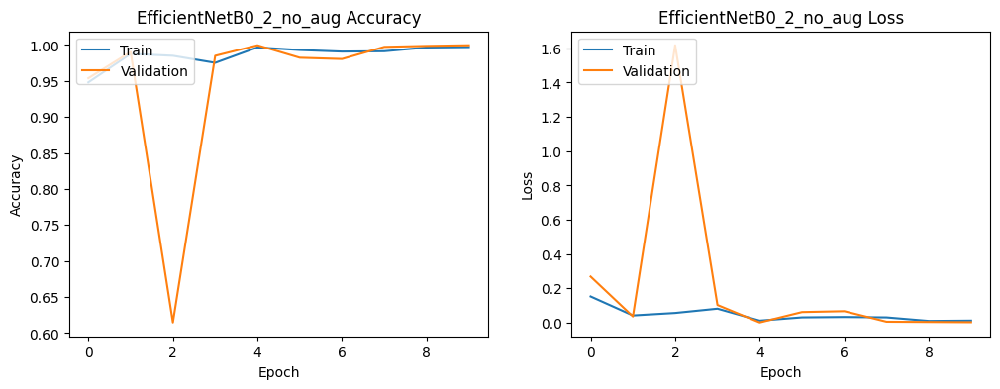

In [61]:
callbacks_eb0_2_no_aug = create_callbacks(
    model_name='EfficientNetB0_2_no_aug',
    checkpoint_path=checkpoint_path,
    patience=5,       
)

efficientnet_b0_2_no_aug = create_model_2(EfficientNetB0, input_shape=(224, 224, 3))

history_b0_2_no_aug, model_b0_2_no_aug = train_and_plot(efficientnet_b0_2_no_aug, 'EfficientNetB0_2_no_aug', train_generator_no_aug, val_generator, callbacks_eb0_2_no_aug,epochs=10)

In [63]:
import os
import hashlib
from collections import defaultdict

def find_duplicate_images(root_dir):
    # Dictionary to store file hashes and their paths
    hash_dict = defaultdict(list)
    
    # Traverse all directories and files
    for subdir, _, files in os.walk(root_dir):
        for file in files:
            file_path = os.path.join(subdir, file)
            
            # Open the file in binary mode and create a hash
            with open(file_path, 'rb') as f:
                file_hash = hashlib.md5(f.read()).hexdigest()
            
            # Append the file path to the list of this hash
            hash_dict[file_hash].append(file_path)
    
    # Find duplicates (hashes with more than one file path)
    duplicates = {hash: paths for hash, paths in hash_dict.items() if len(paths) > 1}
    
    # Print duplicate files
    if duplicates:
        print("Duplicate images found:")
        for hash, paths in duplicates.items():
            print(f"Hash: {hash}")
            for path in paths:
                print(f" - {path}")
    else:
        print("No duplicate images found.")
    
    return duplicates

# Example usage
root_dir = './splitted_lung_2'  # Replace with the path to your dataset folder
duplicates = find_duplicate_images(root_dir)

Duplicate images found:
Hash: e5021ff9b56c9b2ea86b67da32e1642f
 - ./splitted_lung_2/test/lung_scc/lungscc1774.jpeg
 - ./splitted_lung_2/test/lung_scc/lungscc4507.jpeg
Hash: a835984249e3721d01335b9e7f2cde9a
 - ./splitted_lung_2/test/lung_scc/lungscc4439.jpeg
 - ./splitted_lung_2/train/lung_scc/lungscc1710.jpeg
Hash: 88411b3a5fa095b98a4c4d9f49938c49
 - ./splitted_lung_2/test/lung_scc/lungscc3644.jpeg
 - ./splitted_lung_2/val/lung_scc/lungscc4354.jpeg
Hash: a918b15d8d0965bbc779af5958479ea2
 - ./splitted_lung_2/test/lung_scc/lungscc1858.jpeg
 - ./splitted_lung_2/train/lung_scc/lungscc4411.jpeg
Hash: f6659097bc1e9ea8372a58b7ad98dda8
 - ./splitted_lung_2/test/lung_scc/lungscc1762.jpeg
 - ./splitted_lung_2/train/lung_scc/lungscc1300.jpeg
Hash: fb8fbe43927fcccc4a0e79cf256851da
 - ./splitted_lung_2/test/lung_scc/lungscc1839.jpeg
 - ./splitted_lung_2/train/lung_scc/lungscc761.jpeg
Hash: 018d46a79a066ef9d3ca551c96168ea5
 - ./splitted_lung_2/test/lung_scc/lungscc4513.jpeg
 - ./splitted_lung_2/trai

36/36 [==============================] - 15s 404ms/step
Classification Report:
               precision    recall  f1-score   support

    lung_aca     1.0000    0.9973    0.9987       750
      lung_n     0.9987    1.0000    0.9993       750
    lung_scc     0.9987    1.0000    0.9993       750

    accuracy                         0.9991      2250
   macro avg     0.9991    0.9991    0.9991      2250
weighted avg     0.9991    0.9991    0.9991      2250



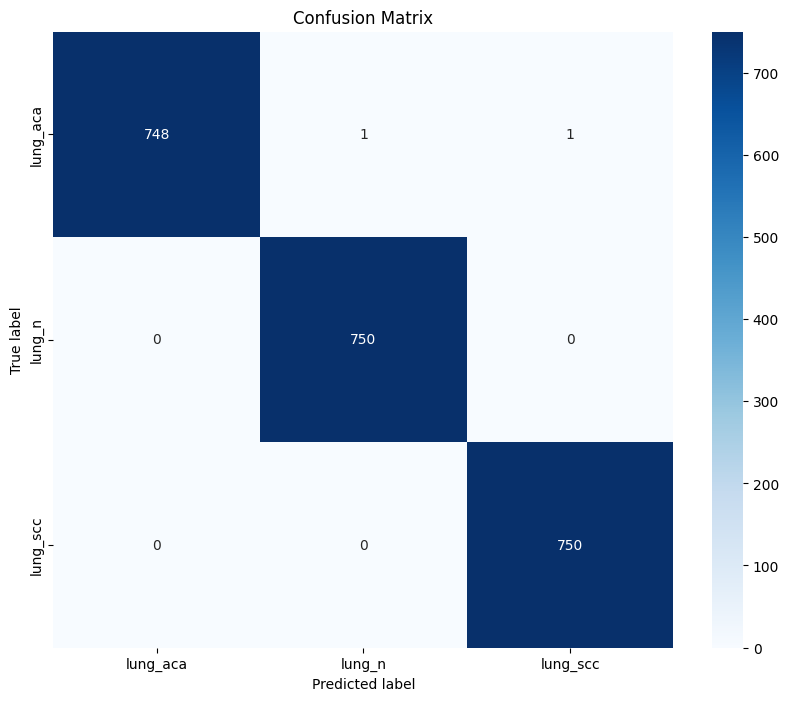

In [62]:
# Call the function after you have trained your model
report_file, cm_file = show_cm_and_classification_report(model_b0_2_no_aug, test_generator, 'EfficientNetB0_2_no_aug')

Epoch 1/10


2024-11-07 07:11:38.738578: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_3/block2b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


165/165 [==============================] - ETA: 0s - loss: 0.2513 - accuracy: 0.9088
Epoch 1: val_accuracy improved from -inf to 0.62222, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB0_2.h5


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


165/165 [==============================] - 111s 602ms/step - loss: 0.2513 - accuracy: 0.9088 - val_loss: 4.4437 - val_accuracy: 0.6222 - lr: 0.0010
Epoch 2/10
165/165 [==============================] - ETA: 0s - loss: 0.0975 - accuracy: 0.9700
Epoch 2: val_accuracy improved from 0.62222 to 0.99022, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB0_2.h5
165/165 [==============================] - 63s 384ms/step - loss: 0.0975 - accuracy: 0.9700 - val_loss: 0.0306 - val_accuracy: 0.9902 - lr: 0.0010
Epoch 3/10
165/165 [==============================] - ETA: 0s - loss: 0.0421 - accuracy: 0.9870
Epoch 3: val_accuracy improved from 0.99022 to 0.99733, saving model to /workspace/TelU-TugasAkhir/model/weights/model_EfficientNetB0_2.h5
165/165 [==============================] - 64s 385ms/step - loss: 0.0421 - accuracy: 0.9870 - val_loss: 0.0082 - val_accuracy: 0.9973 - lr: 0.0010
Epoch 4/10
165/165 [==============================] - ETA: 0s - loss: 0.0440 - accuracy:

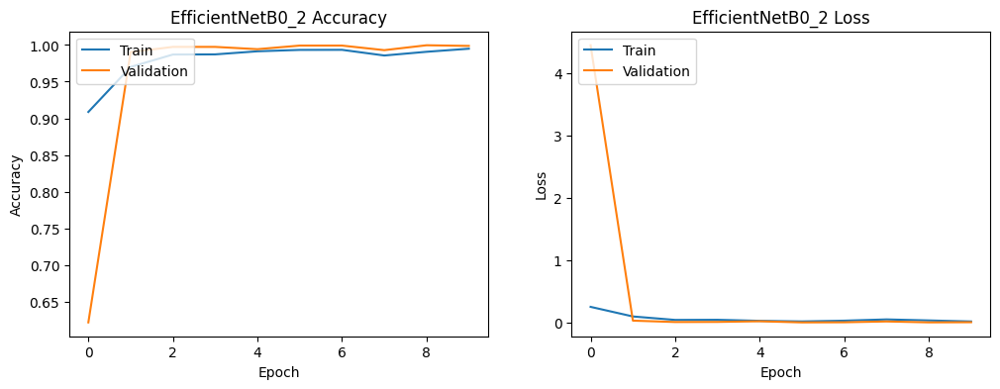

In [53]:
callbacks_eb0_2 = create_callbacks(
    model_name='EfficientNetB0_2',
    checkpoint_path=checkpoint_path,
    patience=5,       
)

efficientnet_b0_2 = create_model_2(EfficientNetB0, input_shape=(224, 224, 3))

history_b0_2, model_b0_2 = train_and_plot(efficientnet_b0_2, 'EfficientNetB0_2', train_generator_with_aug, val_generator, callbacks_eb0_2,epochs=10)

36/36 [==============================] - 15s 405ms/step
Classification Report:
               precision    recall  f1-score   support

    lung_aca     1.0000    0.9960    0.9980       750
      lung_n     1.0000    1.0000    1.0000       750
    lung_scc     0.9960    1.0000    0.9980       750

    accuracy                         0.9987      2250
   macro avg     0.9987    0.9987    0.9987      2250
weighted avg     0.9987    0.9987    0.9987      2250



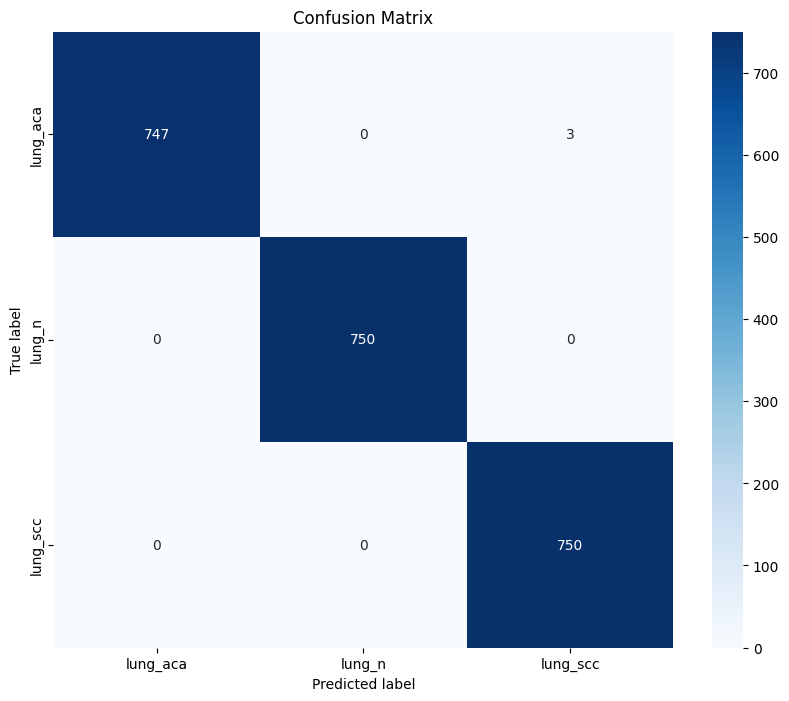

In [54]:
# Call the function after you have trained your model
report_file, cm_file = show_cm_and_classification_report(model_b0_2, test_generator, 'EfficientNetB0_2')

In [55]:
# Grad-CAM implementation
def get_gradcam_model(model, last_conv_layer_name):
    grad_model = Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )
    return grad_model

def compute_gradcam(grad_model, img_array, last_conv_layer_name, pred_index=None):
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        output = predictions[:, pred_index]

    grads = tape.gradient(output, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    conv_outputs = conv_outputs.numpy()
    pooled_grads = pooled_grads.numpy()

    # Multiply each channel in the feature map array by "how important this channel is" with regard to the prediction
    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i]

    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)  # ReLU and normalize
    return heatmap


In [56]:
def generate_and_display_gradcam_heatmaps(models, img_path, class_name):
    """
    Generates and displays Grad-CAM heatmaps for a list of models on a single image.

    Parameters:
        models (list): List of dictionaries with model, target size, and layer name for each model.
        img_path (str): Path to the input image.
        class_name (str): Name of the image class for display purposes.
    """
    plt.figure(figsize=(20, 5))
    
    # Display original image
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=models[0]['target_size'])
    plt.subplot(1, len(models) + 1, 1)
    plt.imshow(img)
    plt.title(f"Original Image ({class_name})")
    plt.axis('off')

    # Generate and display Grad-CAM for each model
    for i, model_info in enumerate(models, start=2):
        # Preprocess the image for the model
        img_resized = tf.keras.preprocessing.image.load_img(img_path, target_size=model_info['target_size'])
        img_array = tf.keras.preprocessing.image.img_to_array(img_resized)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = tf.keras.applications.efficientnet.preprocess_input(img_array)

        # Generate Grad-CAM heatmap using existing functions
        heatmap = compute_gradcam(model_info['gradcam_model'], img_array, last_conv_layer_name=model_info['last_conv_layer_name'])

        # Resize heatmap and normalize original image for blending
        heatmap_resized = cv2.resize(heatmap, model_info['target_size'])
        heatmap_resized = np.uint8(255 * heatmap_resized)
        heatmap_colored = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
        img_array_normalized = np.uint8(255 * (img_array[0] / np.max(img_array[0])))

        # Blend the heatmap with the original image
        superimposed_img = cv2.addWeighted(heatmap_colored, 0.3, img_array_normalized, 0.7, 0)

        # Display the superimposed heatmap
        plt.subplot(1, len(models) + 1, i)
        plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Heatmap Overlay ({model_info['name']} - {model_info['target_size'][0]}x{model_info['target_size'][1]})")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()


In [57]:
# Define the models with their configurations and precomputed Grad-CAM models
models = [
    {
        'model': model_b0_2,
        'target_size': (224, 224),
        'last_conv_layer_name': 'top_conv',  # Replace with actual last conv layer name
        'gradcam_model': get_gradcam_model(model_b0_2, last_conv_layer_name='top_conv'),
        'name': 'model b0 2'
    },
]

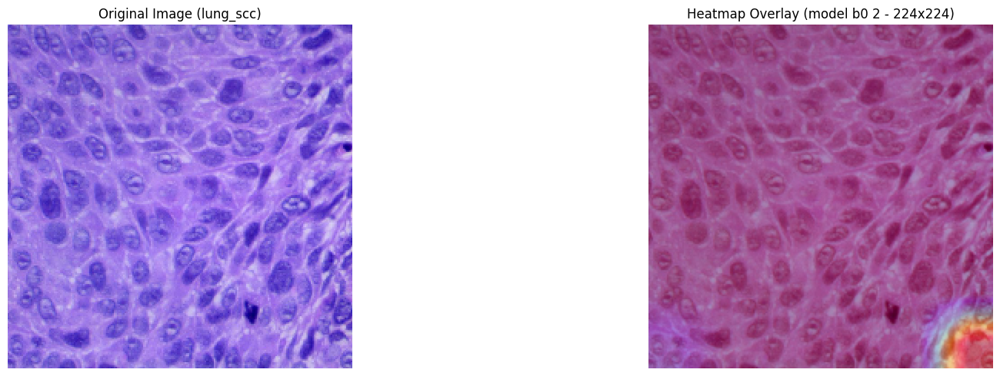

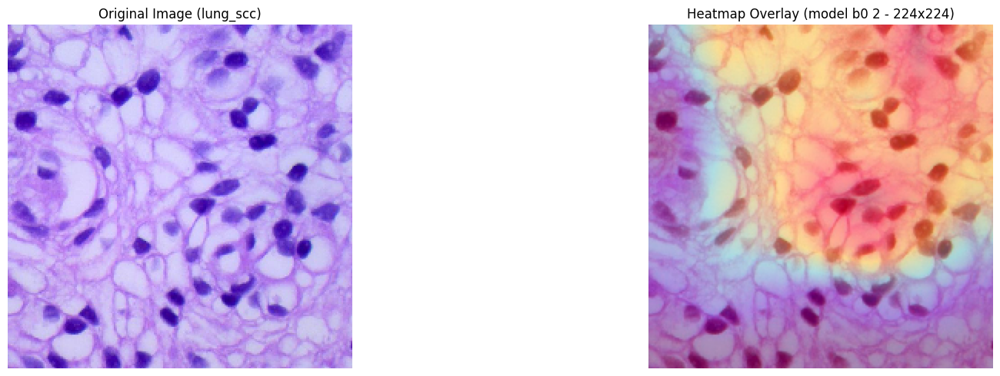

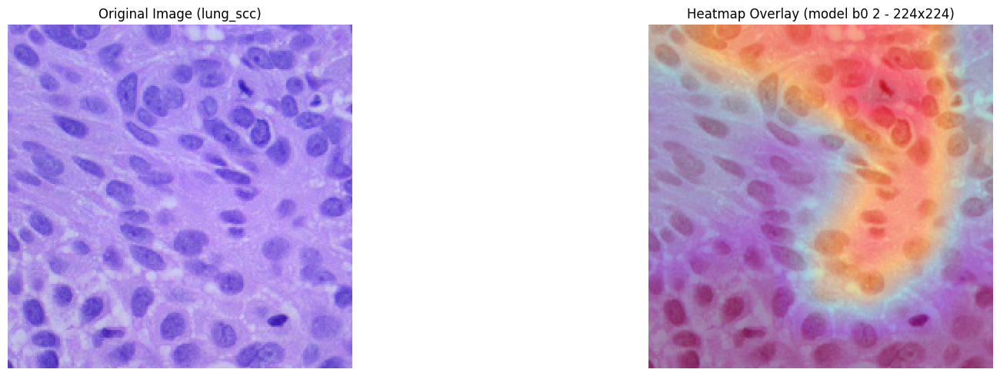

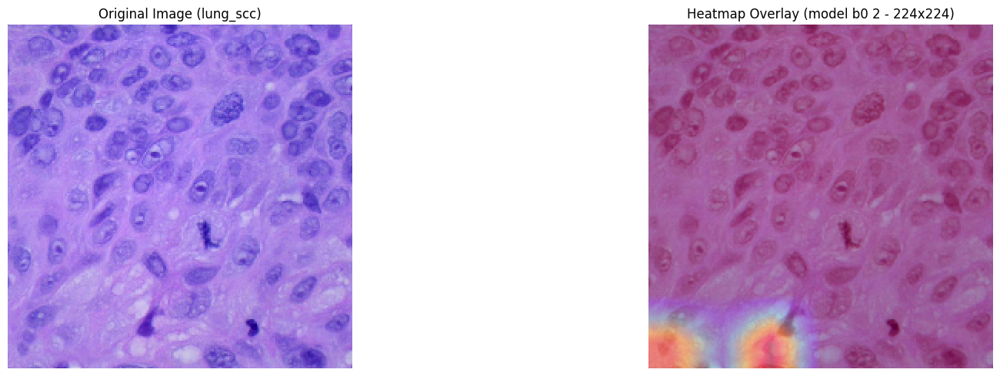

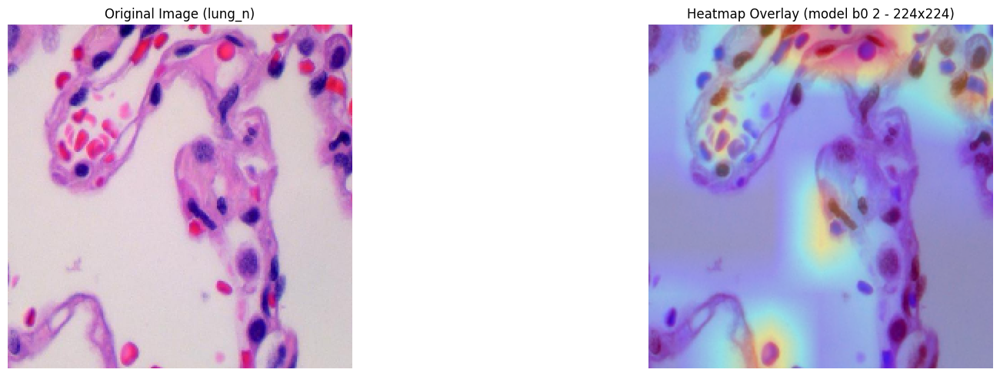

...

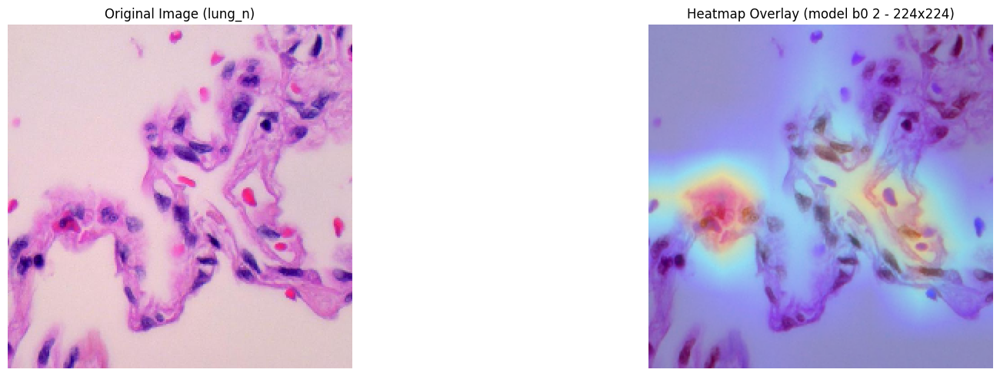

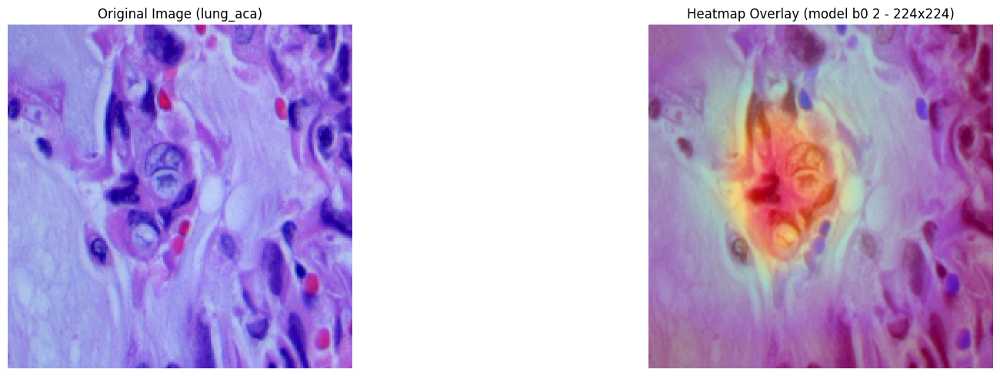

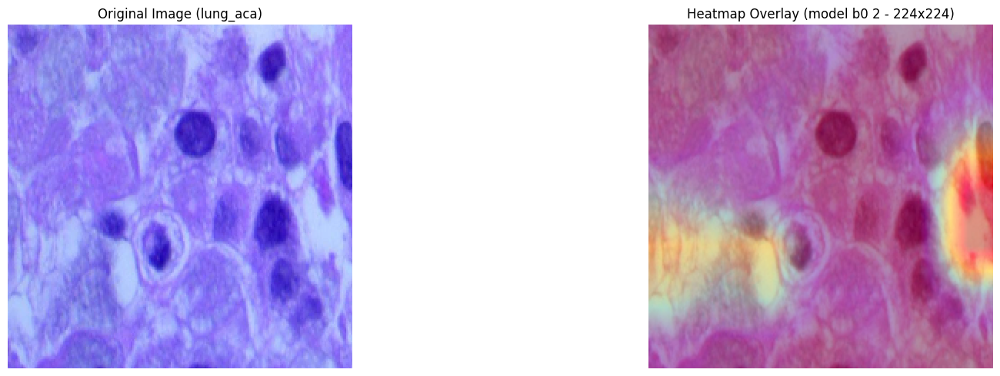

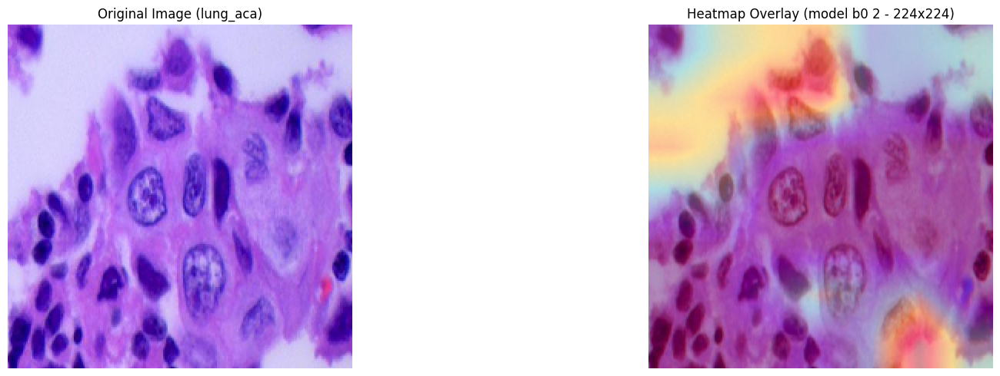

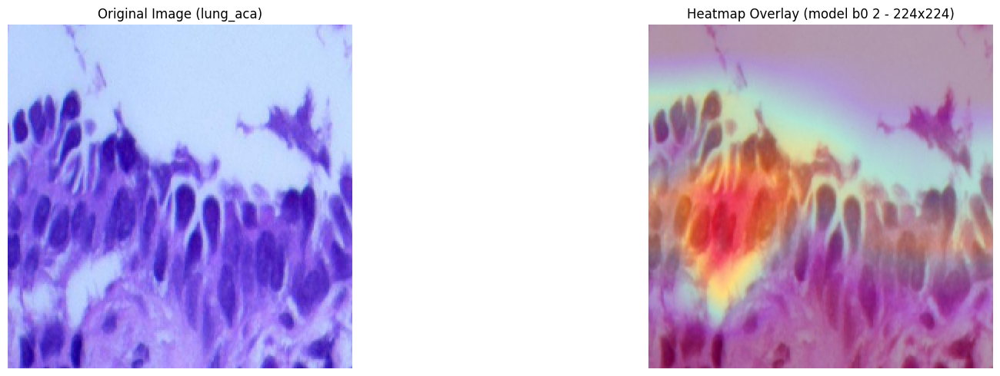

In [60]:
# Directory of test images and class labels
test_dir = './splitted_lung_2/test'
classes = os.listdir(test_dir)

# Display Grad-CAM heatmaps for each class and image sample
samples_per_class = 4
for class_name in classes:
    class_dir = os.path.join(test_dir, class_name)
    images = os.listdir(class_dir)[:samples_per_class]
    
    for img_name in images:
        img_path = os.path.join(class_dir, img_name)
        if os.path.isdir(img_path):  # Skip if it's a directory
            continue
        generate_and_display_gradcam_heatmaps(models, img_path, class_name)